In [1]:
%matplotlib inline

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from collections import Counter

from IPython.display import Image
from IPython.core.display import HTML

from sklearn import linear_model

<h1><center>Correlation between meat consumption and pollution</center></h1>
<h2><center>Dilyan Yordanov Antonov</center></h2>

## Abstract

You are probably familiar that **production of anything pollutes our planet in some way or another.** I decided to find out if this is true for one product in particular - <font color='darkred'>meat</font>. I analysed the meat production, human population and CO2 emissions in the period 1961-2018 for many countries. **I wanted to know if there is any correlation between the meat consumption and the amounts of CO2 in the air in an area**. It was found that we can reffer to the meat consumption with the meat production. Also we found out what can be produced with the same resources. After analysing each of the three mentioned factors separately, I linked the data from each of them. There were formed several groups of countries, which showed us the answer to the hypotesis. Even though the result after analysing was not that shocking, there **is** a correlation. 

## Introduction
About a year and a half ago I had a lot of stomach problems. My doctor advised me to try a different diet for a while. He said that if I still feel bad after this, I would have to take some medicaments. He didn't tell me exactly what to change in my diet. It was on me to decide for myself what food will make me feel better. After I took a quick look at the foods I consumed on daily basis at the time, I found out that I consume a lot of meat. Way more than the average human does. This was the only thing that was weird about the food I consumed. So I decided to a full 180° turn. I challenged myself to eat vegetarian food for a week. No meat. A week seemed a lot at the time. I didn't even eat that many vegetables and fruits before that. So the challenge began. A quick disclamer: by diet I mean the food I consume on daily bases. I don't meat a specific way of eating in order to lose or gain weight. Nowdays the term diet is more used in the second meaning I mentioned.

I started looking online about vegetarian foods and how to make up for the proteins that I consumed with meat before that. I learned a lot! There are so many websites with usefull information. But one day I went down the rabbit hole. The deeper I searched I found more and more publications, papers and post how meat consumption is "killing" the planet. I was very shocked because as a daily eat meater I have never tought that eating just one burger or a chicken wing can have as big effect on the pollution as it was stated in the websites. I read a lot of publication that lean more to the conspiracy side of internet that the facts based one. I noticed a pattern on those websites. There was no linked data to back up the "research" in any of them. The terms data, research and study are thrown around a lot without actually linking their source. If you want to tell me that the delicious steak I am having is killing the planet you have to show me some data... 

As a future Data Scientist (hopefully) I decided to do my own research to see if the statement "eating meat is killing the planet" is true. Obviously the production of everything is polluting the Earth, but I want to find if there is a direct correlation between the meat consumption and the pollution in a place. 

Note: all of the used datasets in this notebook are linked in the "Refferences" at the end. Before using each of them I have explained why I chose it, explained it's properties and structure. Every opperation done on them by me is explained in detail.

## Do we consume more meat globally than ever before?
As a first step to confirming my hypothesis (does meat production have any effect on the pollution in an area) I want to know if meat consumption globally is increasing over time. My idea is to start from the general and than go to the particular. First I will analyse the global data and then the data for each country. In this chapter I want to answer the following questions:

1. Does meat consumption **globally** is increasing
2. What is the **rate** of increasing (exponential or other type)  
3. Are there countries that have **decrease** in meat consumption
4. Is meat consumption increasing **equally** for all countries
        
Let's start by finding the answer to the first question. In economics in general, the demand for something changes it's production. **If there is no demand for a product, the manufacturers will lower or stop entirely it's production.** There are countless examples in the history. For example when the DVD appeared on the market the demand for VHS went so low that many of the big manifacturars at the time went bankrupt (you can learn more about this [here](https://mydigitalkeepsake.com/2018-6-18-the-rise-and-fall-of-vhs/)) That's very straight forward. Meat in no exception. If there is no increase in demand, there will be no increase in production. **This means that we can measure the increase in demand by the increase in production.** I prefer to use the data for production because it is more accurate. Self-reported data often is innacurate or has many missing values - sometimes enough to make the dataset unusable. When reporting data humans often make mistakes even not on purpose. The data for production I am looking for should be much more accurate. Food production is very strictly regulated, therefore the data is collected and is expected to be much more accurate.

### The Data
After looking at many sources of data I decided that the most reliable source out there is the **[Food and Agraculture Organization of the United Nations (FAO)](http://www.fao.org/home/en)** They have built an amazing tool that can extract the exact dataset you need from all of their data. I used it to download a dataset that contain the data for meat production in all availble regions, all availble years and meat only (they have data for eggs, milk and other products produced by animals that are not the object of this research).

Usually when using a dataset it is a good idea to check it's reliability with another one. However, while making the research for this project literally every article or publication linked their data to the [FAO](http://www.fao.org/home/en). Many of the food related datasets on [Kaggle](https://www.kaggle.com/) lead me to this organisation's data. I think this is a good reason not to waste time and effort checking the data.

In [3]:
meat_production_data = pd.read_csv("data/global-meat-production.csv") # Reading the dataset

meat_production_data.head()

,Entity,Code,Year,"Livestock Primary - Meat, Total - 1765 - Production - 5510 - tonnes (tonnes)"
0,Afghanistan,AFG,1961,129420
1,Afghanistan,AFG,1962,132206
2,Afghanistan,AFG,1963,138971
3,Afghanistan,AFG,1964,143830
4,Afghanistan,AFG,1965,150195


In [4]:
meat_production_data.shape

(13561, 4)

### Cleaning

In [5]:
meat_production_data.columns

Index(['Entity', 'Code', 'Year',
       'Livestock Primary - Meat, Total - 1765 - Production - 5510 - tonnes (tonnes)'],
      dtype='object')

As you can see the last column looks very strange. There is no problem with it. The developers decided to add in it information about the product the data is about. We already know that so we don't need it. I renamed it so it just shows the **tonnes**. The **Entity** column will be more clear if was called **Country Name**. The other **Year** column is self explanatory enogh so there is no need for change. 

In [6]:
# Renaming the columns
meat_production_data = meat_production_data.rename(columns={meat_production_data.columns[0]: "Country Name", 
                                     meat_production_data.columns[-1]: "Tonnes"})

meat_production_data.head()

,Country Name,Code,Year,Tonnes
0,Afghanistan,AFG,1961,129420
1,Afghanistan,AFG,1962,132206
2,Afghanistan,AFG,1963,138971
3,Afghanistan,AFG,1964,143830
4,Afghanistan,AFG,1965,150195


Looks much better. The information is the same. We see that each row (observation) contains the data for a country for a specific year. I think that the operations I am about to do on this dataset will be much easier if the index column was the **Country Name** column. However, I will make a copy of the dataset (*meat_production_data_old*) before changing the index to do other operations on. Also the **Code** column might be unnecessary for now. I am going to save it in a separate variable, because I might need it later.  The expected shape of the dataset we will get is **13561 rows x 3 columns**. After that you can see a sample of  20 rows. 

In [7]:
# meat_production_data = meat_production_data.drop(["Code"], axis = 1) # Removing the Code column

meat_production_data_old = meat_production_data

meat_production_data = meat_production_data.set_index(meat_production_data.columns[0]) # Making the Country Name column an index

In [8]:
meat_production_data.sample(20)

,Code,Year,Tonnes
Country Name,,,
Finland,FIN,2018,395697
Least Developed Countries,NaN,2008,9262067
Russia,RUS,2008,6268059
Somalia,SOM,2016,192864
Grenada,GRD,1991,872
Saint Vincent and the Grenadines,VCT,1996,1300
Switzerland,CHE,2001,432363
Dominica,DMA,2007,1365
Yugoslavia,OWID_YGS,1982,1500830


In [9]:
meat_production_data.shape

(13561, 3)

The shape is the same as expected. For now everything looks good, but I want to know the types of each column as well as if there are any missing values.

In [10]:
meat_production_data.dtypes # Checking the type of each column

Code      object
Year       int64
Tonnes     int64
dtype: object

Both **Year** and **Tonnes** columns are in ***int64*** which is the type we want. The next cell checks for missing values and shows them.

In [11]:
meat_production_data.isnull().values.any() # Checking for missing values

True

In [12]:
meat_production_data[meat_production_data.isnull().any(axis=1)].sample(20)

,Code,Year,Tonnes
Country Name,,,
Europe,NaN,2001,50829580
Micronesia (region),NaN,2016,3700
"Asia, Central",NaN,2002,1552170
Micronesia (region),NaN,2001,2786
"Asia, Central",NaN,2018,2904082
Micronesia (region),NaN,1974,2183
Americas,NaN,1963,27929147
Africa,NaN,1967,4592815
Western Asia,NaN,1990,2789136


So the missing values are in the **Code** column. I see that many of the missing values are not of countries, but of regions. This is the next step of the cleaning, so we will get rid of most of them anyway.

Let's get to know the data a bit more. Here we will make use of the copy of the dataset before the index change. The following cell extracts all the countries and prints them. That way we will get a better understanding of the data we have. After it is the number of countries of the dataset.

In [13]:
all_uniques_countries = meat_production_data_old["Country Name"].unique() # Getting all countries

for country in all_uniques_countries:
    print(country)

Afghanistan
Africa
Albania
Algeria
American Samoa
Americas
Angola
Antigua and Barbuda
Argentina
Armenia
Asia
Asia, Central
Australia
Australia & New Zealand
Austria
Azerbaijan
Bahamas
Bahrain
Bangladesh
Barbados
Belarus
Belgium
Belgium-Luxembourg
Belize
Benin
Bermuda
Bhutan
Bolivia
Bosnia and Herzegovina
Botswana
Brazil
British Virgin Islands
Brunei
Bulgaria
Burkina Faso
Burundi
Cambodia
Cameroon
Canada
Cape Verde
Caribbean
Central African Republic
Central America
Chad
Chile
China
Colombia
Comoros
Congo
Cook Islands
Costa Rica
Cote d'Ivoire
Croatia
Cuba
Cyprus
Czech Republic
Czechoslovakia
Democratic Republic of Congo
Denmark
Djibouti
Dominica
Dominican Republic
Eastern Africa
Eastern Asia
Eastern Europe
Ecuador
Egypt
El Salvador
Equatorial Guinea
Eritrea
Estonia
Ethiopia
Ethiopia PDR
Europe
Europe, Western
European Union
Faeroe Islands
Falkland Islands
Fiji
Finland
France
French Guiana
French Polynesia
Gabon
Gambia
Georgia
Germany
Ghana
Greece
Greenland
Grenada
Guadeloupe
Guam
Guatema

In [14]:
number_of_countries = len(all_uniques_countries)

number_of_countries

256

There are **256** countries in the dataset and they are already in alphabetical order. The only strange thing for this dataset is that we have the data for whole continents and regions as well. For example there is **Europe**, but all countries in Europe exist as separate observations (rows). That's the same for all contients. There are all kinds of regions as well - South Eastern Asia, Southern Europe, Northern Europe, etc. If we continue to use the dataframe with those values in we will get invalid results. Basicly all of the values will be doubled. I cannot do this automaticly. For example if I delete every value starting with **South** I will delete the region South Eastern Asia, which we dont want, but I will delete South Korea and South Africa, which are countries. Also there are values like **Low Income Food Deficit Countries**, **USSR** and other very odd ones. That's why I manually went through each value and added those which we don't want into a python list. Then I removed them from the dataframe.


In [15]:
unwanted_regions = ["Asia", "Asia, Central", "Africa", "Americas", "Australia & New Zealand", 
                    "Belgium-Luxembourg", "Central America", "Caribbean", "Eastern Africa", 
                    "Eastern Asia", "Eastern Europe", "Europe", "Europe, Western", 
                    "European Union", "Land Locked Developing Countries", 
                    "Least Developed Countries", "Low Income Food Deficit Countries", 
                    "Micronesia (country)", "Micronesia (region)", "Middle Africa", 
                    "Net Food Importing Developing Countries", "Netherlands Antilles", 
                    "Northern Africa", "World", "Northern America", "Northern Europe", 
                    "Pacific Islands Trust Territory", "Serbia and Montenegro", 
                    "Small island developing States", "South Africa", "South America", 
                    "South Eastern Asia", "South Sudan", "Southern Africa", "Southern Asia", 
                    "Southern Europe", "Sudan (former)", "Oceania", "USSR", "Western Africa", 
                    "Western Asia", "Western Sahara", "Ethiopia PDR"]

len(unwanted_regions)

43

In total there are 43 values that we need to remove from the dataframe. The next cell does that.

In [16]:
meat_production_data = meat_production_data.drop(unwanted_regions)

In the following cell I check the shape of the dataframe to make sure that I actually have removed values.

In [17]:
meat_production_data.shape

(11330, 3)

The original shape was **(13561, 3)**. Just in case I want to make sure that every single one of the values is removed, I check individually if every single one of them exists in the dataset. Double check is better than single check.

In [18]:
for country in unwanted_regions:
    print(country in meat_production_data.index)

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False


All of the unwanted values are out of the data. Now we have to update the ***all_uniques_countries*** variable, because we will need it later.

In [19]:
# Removing every value from the unwanted_regions list

for region in unwanted_regions:
    all_uniques_countries = np.delete(all_uniques_countries, np.argwhere(all_uniques_countries == region))

In [20]:
len(all_uniques_countries)

213

We have **213** left countries to work with. 

The dataset is supposed to have data for the years 1961-2018. This is a period of 58 years and it is perfect to prove my hypotesis. However in the following cell I check if this is true for all countries. If all countries have 58 observations, the dataset is ready to be analysed.  Here we will make use of the dataset with the country name set as index. The following cell iterates over every index (country) and counts how many rows (observations) there are. If it finds that it has less or more than the required 58, it will print it. It also keeps count of how many countires/regions there are with missing values. The code also saves every country name with missing values in the list **countries_missing_values**. We will use it to clean the data later.

In [21]:
total_missing_values = 0  # Keeps count of the countries/regions with missing values
countries_missing_values = []  # A list of all the countries with missing values

for country in all_uniques_countries:

    num_years = sum(meat_production_data.index == country)
    
    if num_years != 58:
        print(f"{country} has {num_years} observations -> INCORRECT")
        
        total_missing_values += 1
        countries_missing_values.append(country)

print("")
print("==========================================================")
print(f"\nNumber of countries/regions with missing values - {total_missing_values}")

Armenia has 27 observations -> INCORRECT
Azerbaijan has 27 observations -> INCORRECT
Belarus has 27 observations -> INCORRECT
Belgium has 19 observations -> INCORRECT
Bosnia and Herzegovina has 27 observations -> INCORRECT
Croatia has 27 observations -> INCORRECT
Czech Republic has 26 observations -> INCORRECT
Czechoslovakia has 32 observations -> INCORRECT
Eritrea has 26 observations -> INCORRECT
Estonia has 27 observations -> INCORRECT
Ethiopia has 26 observations -> INCORRECT
Faeroe Islands has 53 observations -> INCORRECT
Georgia has 27 observations -> INCORRECT
Kazakhstan has 27 observations -> INCORRECT
Kyrgyzstan has 27 observations -> INCORRECT
Latvia has 27 observations -> INCORRECT
Lithuania has 27 observations -> INCORRECT
Luxembourg has 19 observations -> INCORRECT
Macedonia has 27 observations -> INCORRECT
Moldova has 27 observations -> INCORRECT
Montenegro has 13 observations -> INCORRECT
Palestine has 28 observations -> INCORRECT
Russia has 27 observations -> INCORRECT
S

Out of **213** the are **32** invalid ones. This is ***15%*** of all the countries. There are no countries with extra data. Some have very few missing values - Faeroe Islands has 53 out of 58, but other have way much missing data - Sudan has only 7 out of 58. Most countries have the data for only half ot the availble years. This is too much to treat the traditional way - replace with the average of the other columns. Also the data is time series. Just for this reason alone we cannot replace the data with other. The only thing we can do is to remove the countries with missing values and make analysis for the other **184** countries/regions with full availble data. I don't think here is a point in keeping the **[Faroe Islands](https://en.wikipedia.org/wiki/Faroe_Islands)**, because according to [Wikipedia](https://en.wikipedia.org/wiki/Main_Page) they have an area of just 1399 km^2 and population of 52,111 people. This will just disturb our data. It's better to have more accurate analysis for fewer countries than to have an inacurate one for the whole world.

To remove the observations with missing data we will use the **countries_missing_values** list, which is holding the names of all of the countries with missing years.

In [22]:
meat_production_data = meat_production_data.drop(countries_missing_values)

The following cell checks the shape of the dataset to make sure that values were actually removed. Before the shape was **(11562, 3)**.

In [23]:
meat_production_data.shape

(10498, 3)

There are **832** less observations (rows) after this operation. Just like before, the next cell checks if any of the invalid indexes (countries) are still in the dataset.

In [24]:
for country in countries_missing_values:
    print(country in meat_production_data.index)

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False


All of the countries are no longer in the dataset. Before continuing I want to check again for missing values. 

In [25]:
meat_production_data.isnull().values.any() # Checking for missing values

False

There are no more missing values. With this I consider the cleaning for done. The dataset is ready for analysis.

### Analysis
The first question we have to answer is if meat consumption globally is growing over time. For that we care only about the Year and Tonnes columns. In the following cell I make a copy of the dataset (global_meat_consumption) and I will work on it. I always like to keep a copy of the dataset (if it is not too big) before making any changes just in case I need it later. I grouped the data by the **Year**. Then I summed the Tonnes for each year and the result was a dataset with the year as index and the total tonnes produced by all countries in the period 1961 - 2018.

In [26]:
global_meat_production = meat_production_data # Creating a copy of the original dataset

global_meat_production = global_meat_production.groupby("Year")["Tonnes"].sum() # Grouping and Summing the data

global_meat_production

Year
1961     59768039
1962     62245967
1963     65716149
1964     69081606
1965     71233076
1966     74260044
1967     77465629
1968     80068311
1969     81730497
1970     84730246
1971     87782991
1972     90301707
1973     91143647
1974     95171463
1975     96415812
1976    101112708
1977    103588329
1978    107395253
1979    112650570
1980    116992735
1981    119469842
1982    120701405
1983    124238645
1984    127620305
1985    132639534
1986    136439165
1987    141391477
1988    146725949
1989    148938717
1990    154691086
1991    161315139
1992    167612285
1993    174481533
1994    182654841
1995    193700926
1996    192495239
1997    201914614
1998    210477519
1999    217315020
2000    219685999
2001    222997324
2002    229149980
2003    233925215
2004    239454159
2005    245123422
2006    250786359
2007    255972385
2008    264065185
2009    268721313
2010    275300086
2011    279505324
2012    286496759
2013    292290889
2014    297084448
2015    301969046
2016 

By just looking at the numbers that way we can see that they are increasing with time. Humans are visual creatures so it will be better to plot the data. 

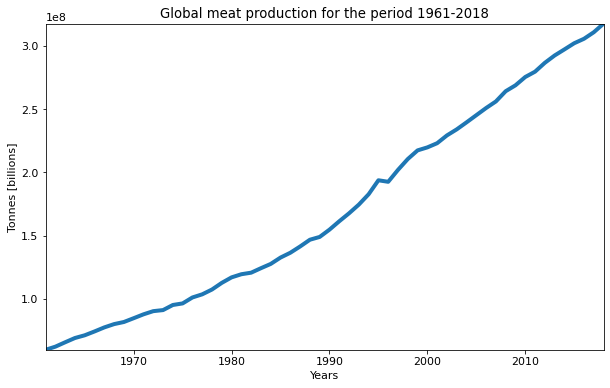

In [27]:
plt.rcParams.update({'font.size': 11}) # Setting the font size
plt.figure(figsize = (10, 6)) # Setting the plot size

plt.plot(global_meat_production.index, global_meat_production, linewidth = 4) # Creating the plot

plt.margins(0)
plt.title("Global meat production for the period 1961-2018")
plt.xlabel("Years")
plt.ylabel("Tonnes [billions]")

plt.show()

So we really produce more meat than ever before. But more important is the rate of growing of the curve. Let's see two different 20 years periods - from 1961 to 1981 and from 1998 to 2018.

At 1961 the world meat production is **59,768,039** tonnes. At 1981 the world meat production is **119,469,842** tonnes.

$$ \frac{119,469,842}{59,768,039} = {1.99}$$

The global meat production almost doubled in just 20 years! Let's do the same operation with the other time period - 1998 to 2018. At 1998 the world meat production is **210,477,519** tonnes. At 2018 the world meat production is **317,448,242** tonnes.

$$ \frac{317,448,242}{210,477,519} = {1.50}$$

For the last 20 years the growth has slightly decreased. It is still above **1**, which means that the global meat production is still increasing. The grow is **not exponential**, but is still increasing in very high rates.

Before making analysis for each country I want to check if this grow rate is correlated to the growth rate of the human population. As I said earlier production increases/decreases with demand. There are three possible outcomes:

 1. The meat production is growing **in the same rate** as the human population
 2. The meat production is growing **faster** that the human population
 3. The meat production is growing **slower** than the human population
     
If it turns out to be the first case, this growth will be completely normal. More people means more food to feed all of them. However, if it turns out to be the second case, this will show us that there is a growth at the amount of meat consumed by the avarage person. The third case will show us that the avarage person consumes less meat than before.

### The Data
After some research I decided to use this **[dataset](https://data.worldbank.org/indicator/SP.POP.TOTL)** provided by the **[The World Bank](https://www.worldbank.org/)**.

In [28]:
human_population = pd.read_csv("data/human_population.csv") # Reading the dataset

human_population

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,Unnamed: 64
0,Aruba,ABW,"Population, total",SP.POP.TOTL,54211.0,55438.0,56225.0,56695.0,57032.0,57360.0,...,102046.0,102560.0,103159.0,103774.0,104341.0,104872.0,105366.0,105845.0,106314.0,NaN
1,Afghanistan,AFG,"Population, total",SP.POP.TOTL,8996973.0,9169410.0,9351441.0,9543205.0,9744781.0,9956320.0,...,30117413.0,31161376.0,32269589.0,33370794.0,34413603.0,35383128.0,36296400.0,37172386.0,38041754.0,NaN
2,Angola,AGO,"Population, total",SP.POP.TOTL,5454933.0,5531472.0,5608539.0,5679458.0,5735044.0,5770570.0,...,24220661.0,25107931.0,26015780.0,26941779.0,27884381.0,28842484.0,29816748.0,30809762.0,31825295.0,NaN
3,Albania,ALB,"Population, total",SP.POP.TOTL,1608800.0,1659800.0,1711319.0,1762621.0,1814135.0,1864791.0,...,2905195.0,2900401.0,2895092.0,2889104.0,2880703.0,2876101.0,2873457.0,2866376.0,2854191.0,NaN
4,Andorra,AND,"Population, total",SP.POP.TOTL,13411.0,14375.0,15370.0,16412.0,17469.0,18549.0,...,83747.0,82427.0,80774.0,79213.0,78011.0,77297.0,77001.0,77006.0,77142.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,Kosovo,XKX,"Population, total",SP.POP.TOTL,947000.0,966000.0,994000.0,1022000.0,1050000.0,1078000.0,...,1791000.0,1807106.0,1818117.0,1812771.0,1788196.0,1777557.0,1791003.0,1797085.0,1794248.0,NaN
260,"Yemen, Rep.",YEM,"Population, total",SP.POP.TOTL,5315355.0,5393036.0,5473671.0,5556766.0,5641597.0,5727751.0,...,23807588.0,24473178.0,25147109.0,25823485.0,26497889.0,27168210.0,27834821.0,28498687.0,29161922.0,NaN
261,South Africa,ZAF,"Population, total",SP.POP.TOTL,17099840.0,17524533.0,17965725.0,18423161.0,18896307.0,19384841.0,...,52004172.0,52834005.0,53689236.0,54545991.0,55386367.0,56203654.0,57000451.0,57779622.0,58558270.0,NaN
262,Zambia,ZMB,"Population, total",SP.POP.TOTL,3070776.0,3164329.0,3260650.0,3360104.0,3463213.0,3570464.0,...,14023193.0,14465121.0,14926504.0,15399753.0,15879361.0,16363507.0,16853688.0,17351822.0,17861030.0,NaN


### Cleaning
The dataset is covering the same years as our meat production dataset. For now we are only interested in the total values for the entire world. We will be examining each country later. So in order to do this I am going to check the shape and datatypes for any mistakes, make a copy of this dataset to work on and remove some of the unnecessary columns. These are the **Country Code, Indicator Name, Indicator Code, 1960, 2019, Unnamed: 64** columns. The names are very self explanatory. There is no information on the website about the last column, so we remove it as well. It doesn't look that it will be usefull in the analysis. I removed the 2 years because they don't exist in the dataset for meat production. I set the **Country Name** as index. This will make separate country analysis much easier.

In [29]:
human_population.shape

(264, 65)

In [30]:
human_population.dtypes

Country Name       object
Country Code       object
Indicator Name     object
Indicator Code     object
1960              float64
                   ...   
2016              float64
2017              float64
2018              float64
2019              float64
Unnamed: 64       float64
Length: 65, dtype: object

It won't be a problem that the years in this dataset are in ***float64***.

In [31]:
human_population = human_population.set_index(human_population.columns[0])

In [32]:
global_human_population = human_population # Creating a copy of the original dataset

# Removing the unnecessary columns
global_human_population = global_human_population.drop(["Country Code",
                                                        "Indicator Name", "Indicator Code",
                                                        "1960", "2019", "Unnamed: 64"], axis = 1)

global_human_population

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
Country Name,,,,,,,,,,,,,,,,,,,,,
Aruba,55438.0,56225.0,56695.0,57032.0,57360.0,57715.0,58055.0,58386.0,58726.0,59063.0,...,101455.0,101669.0,102046.0,102560.0,103159.0,103774.0,104341.0,104872.0,105366.0,105845.0
Afghanistan,9169410.0,9351441.0,9543205.0,9744781.0,9956320.0,10174836.0,10399926.0,10637063.0,10893776.0,11173642.0,...,28394813.0,29185507.0,30117413.0,31161376.0,32269589.0,33370794.0,34413603.0,35383128.0,36296400.0,37172386.0
Angola,5531472.0,5608539.0,5679458.0,5735044.0,5770570.0,5781214.0,5774243.0,5771652.0,5803254.0,5890365.0,...,22514281.0,23356246.0,24220661.0,25107931.0,26015780.0,26941779.0,27884381.0,28842484.0,29816748.0,30809762.0
Albania,1659800.0,1711319.0,1762621.0,1814135.0,1864791.0,1914573.0,1965598.0,2022272.0,2081695.0,2135479.0,...,2927519.0,2913021.0,2905195.0,2900401.0,2895092.0,2889104.0,2880703.0,2876101.0,2873457.0,2866376.0
Andorra,14375.0,15370.0,16412.0,17469.0,18549.0,19647.0,20758.0,21890.0,23058.0,24276.0,...,84463.0,84449.0,83747.0,82427.0,80774.0,79213.0,78011.0,77297.0,77001.0,77006.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Kosovo,966000.0,994000.0,1022000.0,1050000.0,1078000.0,1106000.0,1135000.0,1163000.0,1191000.0,1219000.0,...,1761474.0,1775680.0,1791000.0,1807106.0,1818117.0,1812771.0,1788196.0,1777557.0,1791003.0,1797085.0
"Yemen, Rep.",5393036.0,5473671.0,5556766.0,5641597.0,5727751.0,5816247.0,5907874.0,6001852.0,6097035.0,6193384.0,...,22516460.0,23154855.0,23807588.0,24473178.0,25147109.0,25823485.0,26497889.0,27168210.0,27834821.0,28498687.0
South Africa,17524533.0,17965725.0,18423161.0,18896307.0,19384841.0,19888250.0,20406864.0,20942145.0,21496075.0,22069776.0,...,50477011.0,51216964.0,52004172.0,52834005.0,53689236.0,54545991.0,55386367.0,56203654.0,57000451.0,57779622.0


### Analysis

Let's see the summed data for each year from all the countries.

In [33]:
global_human_population = global_human_population.sum(axis=0) # Summing the values for each year
global_human_population

1961    3.107537e+10
1962    3.162627e+10
1963    3.231187e+10
1964    3.300286e+10
1965    3.371091e+10
1966    3.445637e+10
1967    3.519903e+10
1968    3.595548e+10
1969    3.674947e+10
1970    3.755483e+10
1971    3.838092e+10
1972    3.919697e+10
1973    4.000768e+10
1974    4.082101e+10
1975    4.161869e+10
1976    4.240374e+10
1977    4.318617e+10
1978    4.398215e+10
1979    4.479740e+10
1980    4.562258e+10
1981    4.646988e+10
1982    4.735204e+10
1983    4.824465e+10
1984    4.913661e+10
1985    5.004608e+10
1986    5.098292e+10
1987    5.194457e+10
1988    5.291680e+10
1989    5.388774e+10
1990    5.487887e+10
1991    5.583954e+10
1992    5.677181e+10
1993    5.770584e+10
1994    5.863166e+10
1995    5.955725e+10
1996    6.046936e+10
1997    6.137943e+10
1998    6.228047e+10
1999    6.316946e+10
2000    6.405181e+10
2001    6.493030e+10
2002    6.580809e+10
2003    6.668902e+10
2004    6.757537e+10
2005    6.846785e+10
2006    6.936669e+10
2007    7.027085e+10
2008    7.118

Again just by looking at the numbers we can see a pattern. I noticed something interested here. The value in the dataset for 2018 is **8,066,844,000**! At the moment of writing this research it is year 2020 and I don't think the world populations has gone over 8 billion. My guess is that when they were making this dataset it was some years ago and the data given for the most recent years is predicted by machine learning algorithm. I compared this data to other sources manually and it turns out that every dataset has some differences. Since this data is not that much far off and we are using it only to prove the correlation between the population and meat production, I think that it won't be a problem to continue using this dataset. Once again, the important thing is the rates of which the production and population are growing, not the numbers themselves. The final hypotesis will not be affected by at all. 

Let's look at the plot to get a better understanding for this data. 

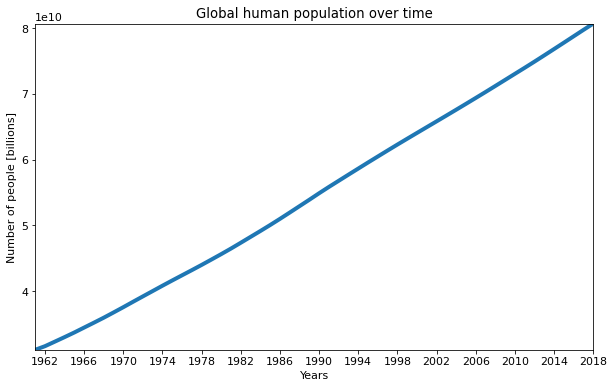

In [34]:
plt.rcParams.update({'font.size': 11}) # Setting the font size
plt.figure(figsize = (10, 6)) # Setting the plot size

plt.plot(global_human_population.index, global_human_population, linewidth = 4) # Creating the plot

plt.margins(0)
plt.xticks(range(1, 58, 4))
plt.title("Global human population over time")
plt.xlabel("Years")
plt.ylabel("Number of people [billions]")

plt.show()

Yes, the population is rising at alarming rates. There is more than enough information out there about this and how it might become our biggest problem. As much as I love this topic, it is not the point of this project. 
Let's see the growth rate at the same 20 year intervals - from 1961 to 1981 and from 1998 to 2018.

At 1961 the world population is **3,107,537,000** people. At 1981 the world population is **4,646,988,000**.

$$ \frac{4,646,988,000}{3,107,537,000} = {1.50}$$

The meat production growth rate at that same time period was **1.89**. Let's do the same for the other time period and than make conclusions. 

At 1998 the world population is **6,228,047,000** people. At 2018 the world population is **8,066,844,000**.

$$ \frac{8,066,844,000}{6,228,047,000} = {1.30}$$

I compared those values to the same calculations done on other data for the world populations and it turn's out that the proportions when devided are very close (0.01 difference). This once again shows us that we can use this dataset to check this correlation.

What we are looking for here is if both meat production and human population are increasing or dicreasing in the same rate.

Before making this analysis for each country I want to check if this grow rate is correlated to the growth rate of the human population. These are three possible outcomes:

 1. The human population is growing **in the same rates** as the meat production
 2. The meat production is growing **faster** that the human population
 3. The meat production is growing **slower** than the human population


Let's take that data from the last calculations. The growth rate of meat production to human population for the period 1961-1981 are **1.99** and **1.50**. For the period 1961-1981 they are **1.50** and **1.30**. Those are the oldest and most recent time intervals of 20 years we have in the data.

By those calculations we confirmed that both the meat production is growing slightly faster than the human population, but the meat production is deffinetly **dependent** on the human population. This is because as human population growth rate go down in recent years, the meat production growth rates does go down as well. However, the growth rate of the meat production in both 20 year periods is a bit bigger than the human population's. They are both increasing, but the meat production is increasing a bit faster.

With this data we can confidently state that the growth rate is the **second type** (the meat production is growing faster that the human population), but with the important note that the meat production is dependent on the human population.

This also answers the first two questions of this chapter:
1. Does meat consumption globally is increasing
2. In what rates it is increasing (exponential or other type) 

The first question: **Yes**. Meat production globally is increasing

The second question: The growth rate is **not** exponential. Actually it is the closest to **linear** when looked at the plot. 

The third and forth questions we asked in the beginign of this chapter are **"Are there countries that have decrease in meat consumption" and "Is meat consumption increasing equally for all countries"** In the following cell I wrote a function that shows the meat production plot for a specific country. It accepts only a country name and shows a line plot of the meat production for the whole availble period (1961-2018). Because there are countries/regions with more than 1 word and the words after the first are capital as well, we cannot use the python function **.capitalize()**. It would only work if we had only 1 word names. Due to this the input is **case sensitive**.

In [35]:
def show_country_data(country_name, dataframe, multiple = False):
    """
    Shows a line plot for the given country. Uses the data from the given dataframe.
    
    Parameters:
    country_name (str): The name of the country to plot.
    
    dataframe (pandas.core.series.Series): The source of the data
    
    Returns:
    matplotlib.pyplot
    """
    
    plt.figure(figsize=(10, 5))
    
    country = dataframe.loc[country_name] # Contains the data for the country

    plt.plot(country["Year"], country["Tonnes"], linewidth = 4) # Plotting the data
    
    plt.margins(0)
    plt.title(f"{country_name} meat production over time")
    plt.xlabel("Years")
    plt.ylabel("Tonnes")

    plt.show()

In the following cell you can change the name in the quotes to see the data for any of the availble countries/regions. As an example I have shown the plot for Bulgaria. You can use it to quickly get the plot for any country.

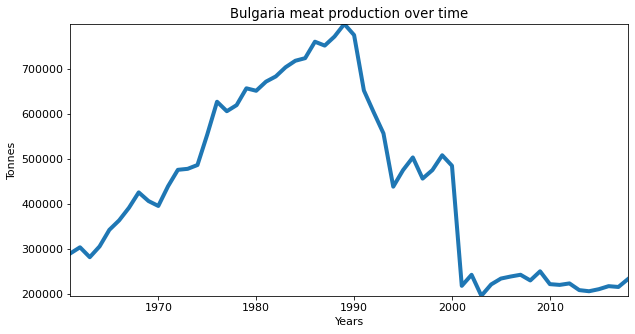

In [36]:
show_country_data("Bulgaria", meat_production_data)

In the following cell I set the index (country) as a column again. The reason for this change is that it will make the whole process much easier. Now we need it back as a normal column. After the code that does that you can see an sample of the dataframe showing how it looks after the operation.

In [37]:
all_countries_data = meat_production_data.reset_index(level=['Country Name'])

all_countries_data.sample(20)

,Country Name,Code,Year,Tonnes
8285,Saudi Arabia,SAU,2010,760984
10262,Vietnam,VNM,2015,4709383
7236,Papua New Guinea,PNG,2005,406919
3394,Germany,DEU,1991,6629808
1150,Brazil,BRA,2009,22610720
5948,Melanesia,OWID_MNS,1993,323673
8301,Senegal,SEN,1968,63692
1367,Burkina Faso,BFA,1994,135834
4445,Iran,IRN,1998,1490883
3285,Gabon,GAB,1998,31245


Let's do a quick recap. We proved that we eat more meat globally than ever before. Also found the growth rate of the global meat production in two 20 year periods. Then we confirmed that the human population is growing and fount out it's growth over the same two periods. The next step was to compare the two growths and we found a correlation that the meat production is growing faster than the human population, but is filly dependent on it (not vice versa). This is because when human population goes down, the same happens with the meat production. We answered the two questions from the begining of this chapter and how it's time for the third one.

The following function takes a list of countries and returns the plot for each of them. 

In [38]:
def show_plots_category(category, dataframe, title_data, secondary_value="Tonnes"):
    """
    Shows a line plot for each country in the given list. Uses the data from the given dataframe.
    
    Parameters:
    category (list): List containing strings. Each string should be a name of a country.
    
    dataframe (pandas.core.series.Series): The source of the data
    
    title_data (str): Shows what the data is after the country name
    
    secondary_value (str): The name of the second column, containing the value according to the 2 datasets
    
    Returns:
    matplotlib.pyplot
    """
    
    second_value = "" # Contains the name of the second column, containing the value according to the 2 datasets
    
    for i in range(1, len(category)+1):    
        country = category[i-1] # Contains the index of the current country for plotting
        country_data = dataframe.loc[country] # Contains the data for the current country for plotting

        ax = plt.subplot(64, 4, i)
        
        ax.plot(country_data["Year"], country_data[secondary_value], linewidth = 4) # Plotting the data
        ax.set_ylim(ymin=0)
        
        plt.margins(0)
        plt.title(f"{country} {title_data} over time", fontsize=18)
        plt.xlabel("Years", fontsize=14)
        plt.ylabel("Tonnes [billions]", fontsize=14)
        
    plt.show()

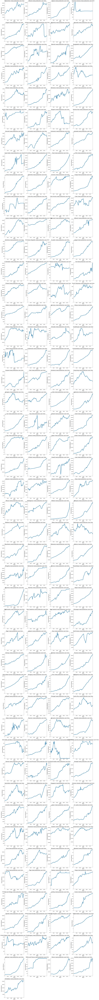

In [39]:
all_uniques = all_countries_data["Country Name"].unique() # Gets every unique country name value

plt.figure(figsize=(28, 450))

show_plots_category(category=all_uniques, dataframe=meat_production_data, title_data="meat production")

Those are the plots for the whole dataset. if you want you can manually check each of them. As a next step I want to classify them. I want to have 2 groups of countries/regions:

1. Countries with **increasing** meat production
2. Countries with **decreasing** meat production
    
The first idea i got to determine which country goes to which category is to compare the value for the first availble year (1961) and the value for the last availble year (2018). This is probably the easiest way to do this. However there is a problem with this method. This would work only if all the countries looked like the example below.

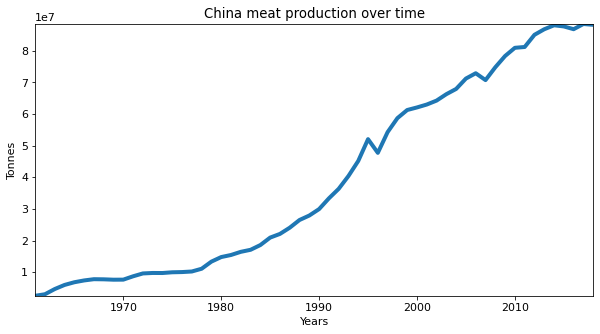

In [40]:
show_country_data("China", meat_production_data)

To use this method all of the countries must be going straight up or down. In the example of **China** there is almost no disturbtion. However, not all countries's plots looke like this. Many of them have huge spikes folloed by a incline or decline. See **Bulgaria** for example.

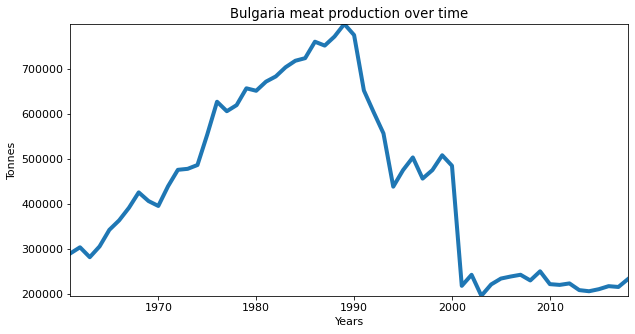

In [41]:
show_country_data("Bulgaria", meat_production_data)

If we only look at the first and last value we will determine that there is a slight decrease in the meat production. However on the plot you can see a huge spike followed by a huge decline. There are many more examples like this. If we look at the plot of **Bhutan** we can see that there is an overall increase from the first to the last years, but in recent years the meat production is decreasing, followed by an increase and another decrese.

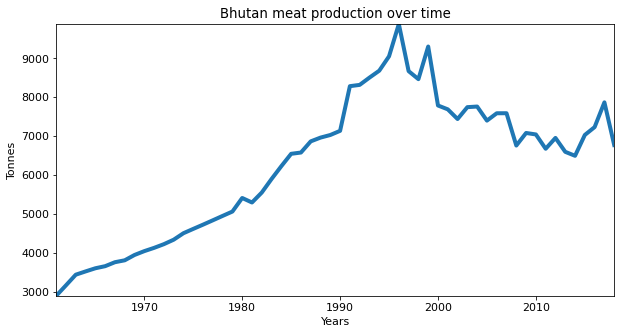

In [42]:
show_country_data("Bhutan", meat_production_data)

The two categories I mentiond work, but I want more detailed data. For this reason I will change them a bit. The new categories are the following:

1. Countries with overall **increase** in meat production **including** recent years
2. Countries with overall **increase** in meat production **excluding** recent years


3. Countries with overall **decrease** in meat production **including** recent years
4. Countries with overall **decrease** in meat production **excluding** recent years

I will store the names of the countries in each category in lists. The following code goes through all countries and determines to which category it should be added. The total increasing or decreasing will be determined by the first and last year. After it there will be a subcatetorising which will determine the increase/decrease for the last 20 years. Than the country name will be added to one of the four lists. Because the names for the lists would be, too long and that would violate the standart convention I am trying to follow, I will name them the following way: ***overall_last20years***. For example ***increasing_decreasing*** means that the value of produced meat for all years in total has increased, but it has decreased for the last 20 years. I believe this is the best way to avoid long and complicated variable names. Here we will make use of the **all_uniques** variable that already contains the names of all countries.

In [43]:
# Variable meaning - overall_last20years

increasing_increasing_meat, increasing_decreasing_meat, decreasing_increasing_meat, decreasing_decreasing_meat = ([], [], [], [])

In [44]:
for i in range(1, len(all_uniques)):
    
    country = all_uniques[i] # Contains the index of the current country for plotting
    country_data = meat_production_data.loc[country]
    
    # Getting the tonnes for each needed year
    tonnes_year_1961 = country_data.loc[country_data["Year"] == 1961, "Tonnes"].item()
    tonnes_year_1998 = country_data.loc[country_data["Year"] == 1998, "Tonnes"].item()
    tonnes_year_2018 = country_data.loc[country_data["Year"] == 2018, "Tonnes"].item()
    
    # Determining the category
    
    if tonnes_year_1961 <= tonnes_year_2018:
        if tonnes_year_1998 <= tonnes_year_2018:
            increasing_increasing_meat.append(country)
        else:
            increasing_decreasing_meat.append(country)
    else:
        if tonnes_year_1998 <= tonnes_year_2018:
            decreasing_increasing_meat.append(country)
        else:
            decreasing_decreasing_meat.append(country)

Let's see lists of the countries that went to each category. After it are plots of each category. The following function takes an list as parameter and shows that plots of all the countries in the category.

<h3><center>Countries from the category increasing_increasing</center></h3>

In [45]:
increasing_increasing_meat_value = len(increasing_increasing_meat) # Holds the number of countries in this category

print(f'{increasing_increasing_meat_value} out 184 of  are in the category "Countries with overall increase in meat production including recent years"')
print("\n")

for country in increasing_increasing_meat:
    print(country)

145 out 184 of  are in the category "Countries with overall increase in meat production including recent years"


Albania
Algeria
Angola
Argentina
Australia
Austria
Bahrain
Bangladesh
Barbados
Belize
Benin
Bolivia
Botswana
Brazil
British Virgin Islands
Brunei
Burkina Faso
Burundi
Cambodia
Cameroon
Canada
Central African Republic
Chad
Chile
China
Colombia
Comoros
Congo
Costa Rica
Cote d'Ivoire
Cuba
Democratic Republic of Congo
Djibouti
Dominica
Dominican Republic
Ecuador
Egypt
El Salvador
Equatorial Guinea
Fiji
Finland
Gabon
Gambia
Germany
Ghana
Grenada
Guadeloupe
Guatemala
Guinea
Guinea-Bissau
Guyana
Haiti
Honduras
Iceland
India
Indonesia
Iran
Iraq
Ireland
Israel
Jamaica
Japan
Jordan
Kenya
Kiribati
Kuwait
Laos
Lebanon
Lesotho
Liberia
Libya
Madagascar
Malawi
Malaysia
Mali
Mauritania
Mauritius
Melanesia
Mexico
Mongolia
Montserrat
Morocco
Mozambique
Myanmar
Namibia
Nauru
Nepal
New Caledonia
New Zealand
Nicaragua
Nigeria
Niue
North Korea
Norway
Oman
Pakistan
Panama
Papua New Guinea
Paragua

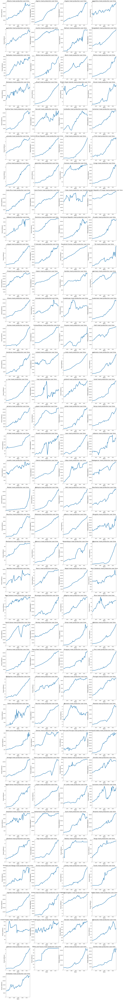

In [46]:
plt.figure(figsize=(28, 450))

show_plots_category(category=increasing_increasing_meat, dataframe=meat_production_data, title_data="meat production")

<h3><center>Countries from the category increasing_decreasing</center></h3>

In [47]:
increasing_decreasing_meat_value = len(increasing_decreasing_meat) # Holds the number of countries in this category

print(f'{increasing_decreasing_meat_value} out 184 of  are in the category "Countries with overall increase in meat production excluding recent years"')
print("\n")

for country in increasing_decreasing_meat:
    print(country)

26 out 184 of  are in the category "Countries with overall increase in meat production excluding recent years"


Antigua and Barbuda
Bahamas
Bhutan
Cape Verde
Cook Islands
Cyprus
Denmark
France
French Guiana
French Polynesia
Greece
Greenland
Hong Kong
Hungary
Italy
Macao
Maldives
Malta
Netherlands
Niger
Puerto Rico
Saint Vincent and the Grenadines
Seychelles
Singapore
Sweden
Taiwan


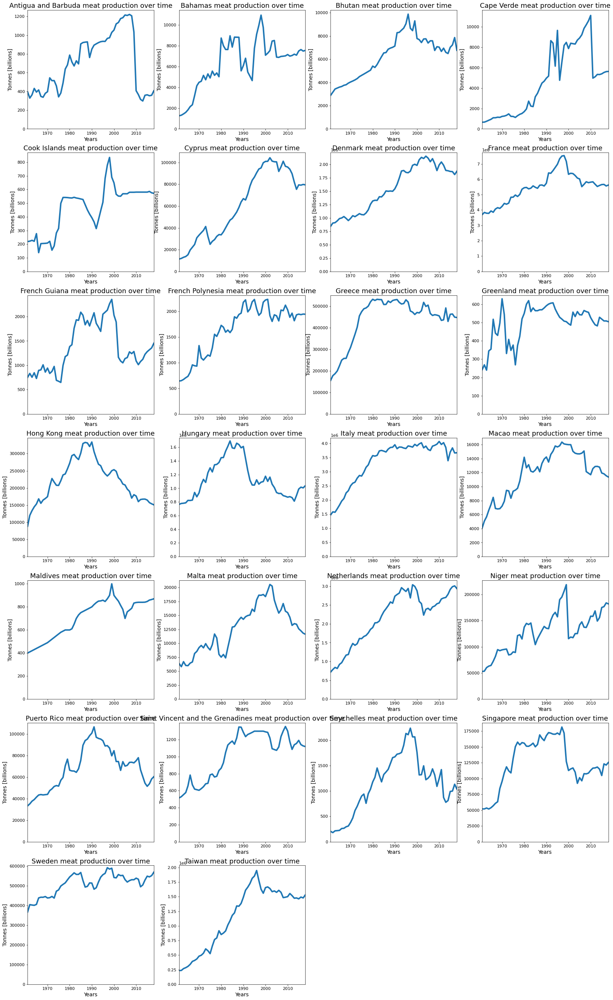

In [48]:
plt.figure(figsize=(28, 450))

show_plots_category(category=increasing_decreasing_meat, dataframe=meat_production_data, title_data="meat production")

<h3><center>Countries from the category decreasing_increasing</center></h3>

In [49]:
decreasing_increasing_meat_value = len(decreasing_increasing_meat) # Holds the number of countries in this category

print(f'{decreasing_increasing_meat_value} out 184 of  are in the category "Countries with overall decrease in meat production excluding recent years"')
print("\n")

for country in decreasing_increasing_meat:
    print(country)

5 out 184 of  are in the category "Countries with overall decrease in meat production excluding recent years"


American Samoa
Bermuda
Guam
Saint Pierre and Miquelon
Timor


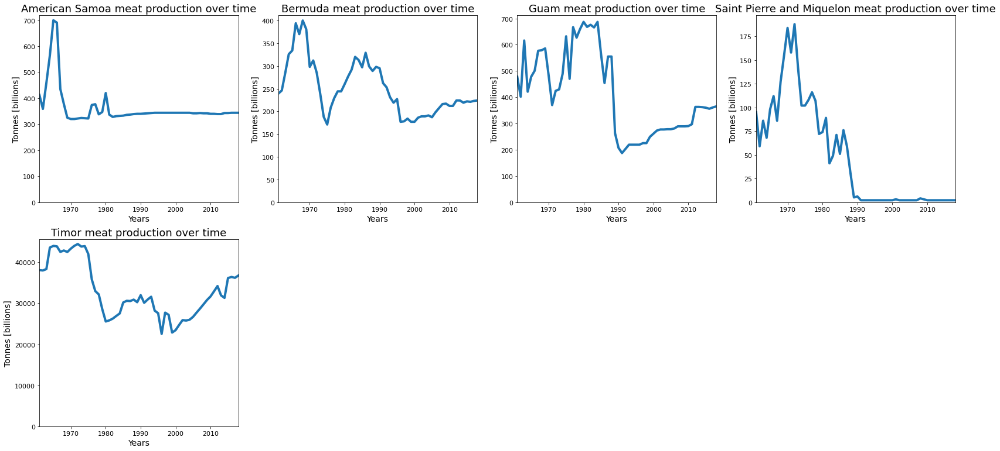

In [50]:
plt.figure(figsize=(28, 450))

show_plots_category(category=decreasing_increasing_meat, dataframe=meat_production_data, title_data="meat production")

<h3><center>Countries from the category decreasing_decreasing</center></h3>

In [51]:
decreasing_decreasing_meat_value = len(decreasing_decreasing_meat) # Holds the number of countries in this category

print(f'{decreasing_decreasing_meat_value} out 184 of  are in the category "Countries with overall decrease in meat production including recent years"')
print("\n")

for country in decreasing_decreasing_meat:
    print(country)

4 out 184 of  are in the category "Countries with overall decrease in meat production including recent years"


Bulgaria
Falkland Islands
Martinique
Saint Kitts and Nevis


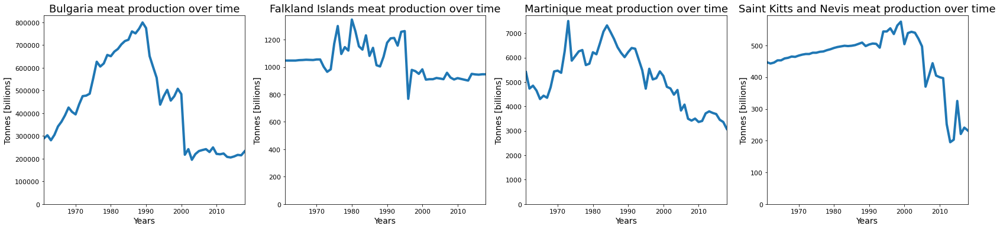

In [52]:
plt.figure(figsize=(28, 450))

show_plots_category(category=decreasing_decreasing_meat, dataframe=meat_production_data, title_data="meat production")

Below you can see two types of plots - bar chart and pie chart, to get a better understanding of the distribution of the 4 categories of countries.

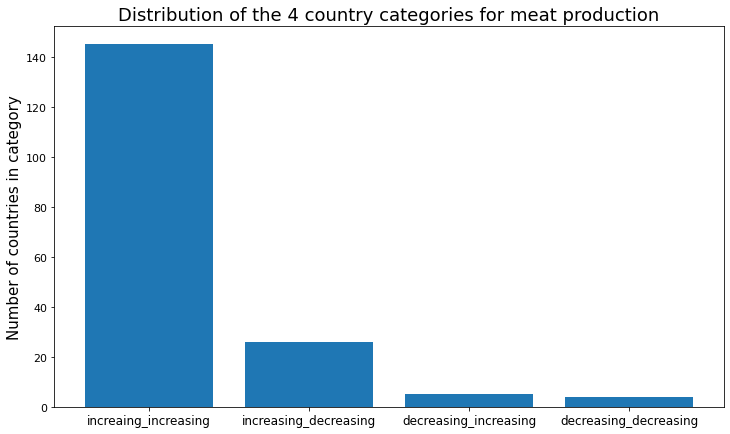

In [53]:
categories = ("increaing_increasing", "increasing_decreasing", "decreasing_increasing", "decreasing_decreasing")
y_pos = np.arange(len(categories))

values = (increasing_increasing_meat_value,
          increasing_decreasing_meat_value,
          decreasing_increasing_meat_value,
          decreasing_decreasing_meat_value)

plt.figure(figsize=(12, 7))

plt.bar(y_pos, values, align='center')
plt.xticks(y_pos, categories, fontsize=12)
plt.ylabel('Number of countries in category', fontsize=15)
plt.title('Distribution of the 4 country categories for meat production', fontsize=18)

plt.show()

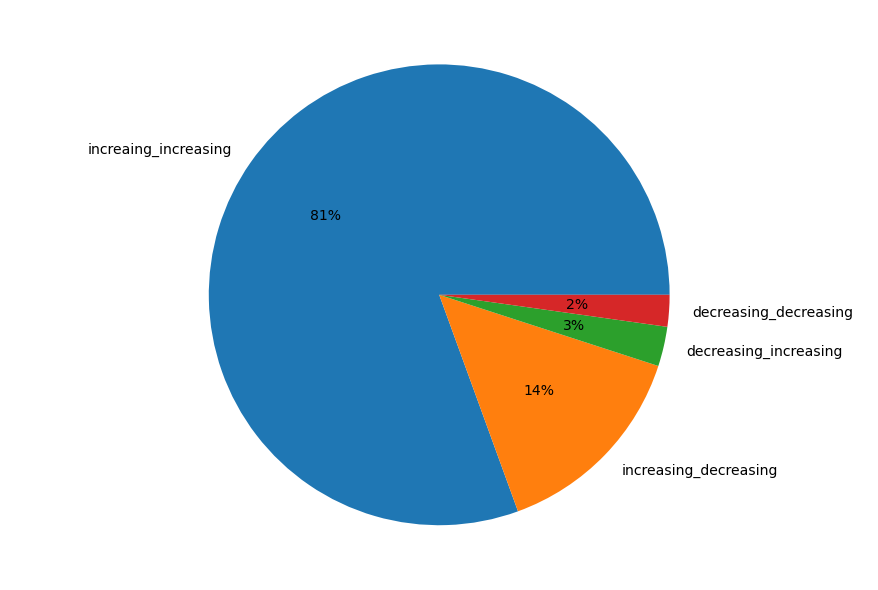

In [54]:
fig = plt.figure()
ax = fig.add_axes([0,1,2,2])
ax.axis('equal')

ax.pie(values, labels = categories,autopct = '%1.0f%%',textprops = {'fontsize': 14})
plt.show()

With the whopping **81%**, the countries that have overall increased meat production and continue to increase their meat production in the last 20 years dominate the charts. They are followed by the countries that have overall increased meat production, but it has decreased during the last 20 years - **14%**. Both categories for countries that have overall decreased meat production combined are just **5%**, while **3%** of them have started to increase in the last 20 years.

We can anwer the the third question from the begining of this chapter - **"Are there countries that have decrease in meat consumption"**, right away:

**Yes**, there are countries that have decreased their meat production in the time period 1961-2018, but they are very small perscent when compared to the countries that have increased their meat production.

Now let's answer the last question and continue to the next chapter. In order to prove if meat consumption is increasig equally for all countries some operations have to be done. First of all - how are we going to determine this. It will be incorect if we compare the tonnes produced by each country. There are very big and very small countries that have increased their production. The big country has more production (in terms of tonnes) to begin with. In the next cell there is a plot of all countries from the increasing_increasing category. There is no legend because there are 178 values displayed at once at it is pretty much pointless. The plot is created to prove other thing.

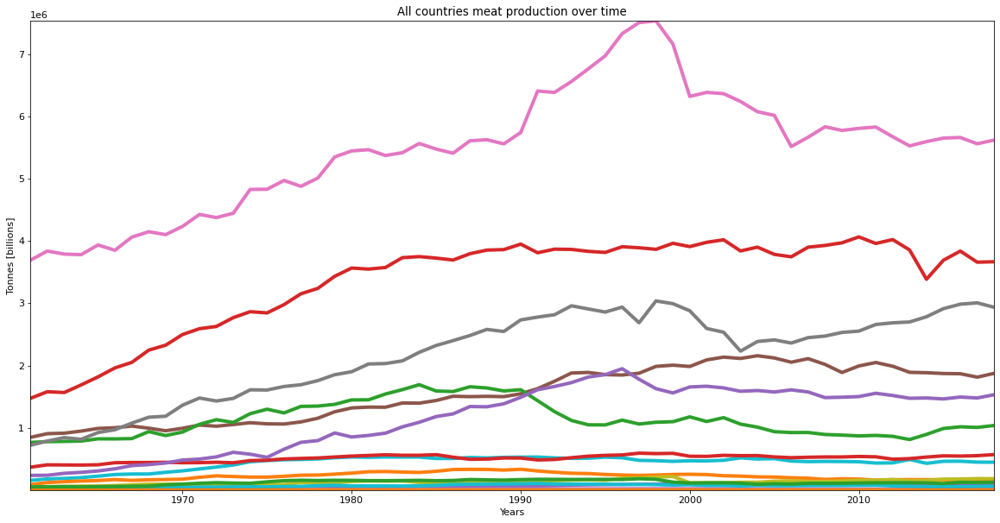

In [55]:
plt.figure(figsize=(20, 10))

for i in range(1, len(increasing_decreasing_meat)):
    
    country = increasing_decreasing_meat[i] # Contains the index of the current country for plotting
    country_data = meat_production_data.loc[country] # Contains the data for the current country for plotting
        
    plt.plot(country_data["Year"], country_data["Tonnes"], linewidth = 4) # Plotting the data
    
    plt.margins(0)
    plt.title("All countries meat production over time")
    plt.xlabel("Years")
    plt.ylabel("Tonnes [billions]")
    
plt.show()

The problem with using the tonnes to determine the growth rate is visible. We have the very big countries on the top and the smaller ones look like like a straight line at the bottom of the plot. Because of that we should compare the coeficients of growth. Exactly the same thing that we did for the global meat production and human population. Then we will compare those coefficients and see if there is tendency in them. I will only do this for the increasing_increasing and increasing_decreasing categories seperetly. Since the other two categories are just 5% of the whole data and they are not helpful in answering the current question, I am going to ignore them for the next operations.

We are going to use the growth ratios from same two 20 year periods as before - 1961 to 1981 and 1998 to 2018. They are calculated with the same formula as the global meat production. R stends for **Ratio** and the years stand for the value in this year:

$$R_1=\frac{1961}{1981}$$

$$R_2=\frac{1998}{2018}$$

First we are going to calculate the growth rate for the increasing_increasing category. The following cell calulates the two Ratios and stores them in separate lists.

In [56]:
inc_inc_r1 = []
inc_inc_r2 = []

for i in range(1, len(increasing_increasing_meat)+1):
    
    country = increasing_increasing_meat[i-1] # Contains the index of the current country for plotting
    country_data = meat_production_data.loc[country]
    
    # Getting the tonnes for each needed year
    tonnes_year_1961 = country_data.loc[country_data["Year"] == 1961, "Tonnes"].item()
    tonnes_year_1981 = country_data.loc[country_data["Year"] == 1981, "Tonnes"].item()
    tonnes_year_1998 = country_data.loc[country_data["Year"] == 1998, "Tonnes"].item()
    tonnes_year_2018 = country_data.loc[country_data["Year"] == 2018, "Tonnes"].item()
    
    r1 = round(tonnes_year_1961/tonnes_year_1981, 2) # Ratio for the year period 1961-1981
    r2 = round(tonnes_year_1998/tonnes_year_2018, 2) # Ratio for the year period 1998-2018
    
    inc_inc_r1.append(r1)
    inc_inc_r2.append(r2)

Just to see if everything looks OK I will print the two lists.

In [57]:
print(inc_inc_r1)

[0.58, 0.41, 0.43, 0.7, 0.54, 0.62, 0.07, 0.79, 0.23, 0.32, 0.46, 0.41, 0.43, 0.38, 1.02, 0.22, 0.7, 0.46, 0.86, 0.57, 0.57, 0.57, 0.67, 0.58, 0.17, 0.51, 0.58, 0.52, 0.36, 0.44, 0.66, 0.96, 0.48, 0.74, 0.46, 0.5, 0.64, 0.66, 0.61, 0.27, 0.45, 0.74, 0.64, 0.6, 0.53, 0.89, 0.33, 0.52, 0.74, 0.66, 0.39, 0.66, 0.34, 0.75, 0.63, 0.47, 0.49, 0.6, 0.55, 0.33, 0.43, 0.23, 0.29, 0.64, 0.86, 0.29, 0.58, 0.55, 0.7, 0.57, 0.09, 0.66, 0.34, 0.33, 0.56, 0.61, 0.34, 0.61, 0.37, 0.7, 0.56, 0.61, 0.55, 0.4, 0.59, 0.48, 0.45, 1.17, 0.62, 0.56, 0.43, 0.32, 0.35, 0.68, 0.23, 0.49, 0.38, 0.63, 0.73, 0.55, 0.4, 0.73, 0.47, 0.37, 0.23, 0.61, 0.36, 0.43, 0.6, 0.59, 0.99, 0.27, 0.59, 0.53, 0.36, 0.63, 0.23, 0.23, 0.73, 0.42, 0.65, 0.56, 0.23, 0.6, 0.43, 0.82, 0.27, 0.24, 0.39, 0.49, 0.6, 0.77, 0.63, 0.29, 0.74, 0.66, 0.69, 0.73, 0.5, 0.29, 0.6, 0.54, 0.62, 0.54, 0.72]


In [58]:
print(inc_inc_r2)

[0.63, 0.67, 0.53, 0.63, 0.77, 0.9, 0.53, 0.59, 0.77, 0.4, 0.57, 0.43, 0.9, 0.45, 1.0, 0.38, 0.6, 0.58, 0.98, 0.65, 0.73, 0.51, 0.32, 0.6, 0.67, 0.48, 0.83, 0.39, 0.61, 0.66, 0.62, 0.9, 0.75, 0.95, 0.62, 0.47, 0.59, 0.57, 0.81, 0.35, 0.87, 0.78, 0.65, 0.75, 0.54, 0.94, 0.84, 0.48, 0.39, 0.63, 0.29, 0.73, 0.44, 0.59, 0.57, 0.48, 0.48, 0.54, 0.91, 0.41, 0.57, 0.76, 0.45, 0.44, 0.52, 0.71, 0.47, 0.72, 0.74, 0.49, 0.98, 0.77, 0.1, 0.48, 0.4, 0.57, 0.44, 0.65, 0.59, 0.62, 0.96, 0.41, 0.8, 0.09, 0.81, 0.92, 0.57, 0.91, 0.94, 0.29, 0.7, 0.81, 0.5, 0.73, 0.38, 0.41, 0.54, 0.67, 0.58, 0.36, 0.52, 0.67, 0.95, 0.9, 0.49, 0.75, 0.96, 0.35, 0.44, 0.9, 0.51, 0.78, 0.45, 0.48, 0.85, 0.94, 0.68, 0.69, 0.43, 0.45, 0.8, 0.89, 0.83, 0.56, 0.72, 0.43, 1.0, 0.87, 0.43, 0.61, 0.34, 0.82, 0.48, 0.55, 0.92, 0.77, 0.91, 0.89, 0.84, 0.82, 0.33, 0.99, 0.36, 0.41, 0.57]


By just looking at them it is very hard to make any conclusions. I want to see how many times each value occures. By doing this we will be able to determine the **type of the distribution**. It will give us the answer to the forth and final question from the begining of this chapter - **Is meat consumption increasing equally for all countries**.

The fastest way to count how many times each value occures in the list is by using the ***Counter*** function from the collections library. It converts the list to a dictionary with format ***value: occurencies***. After the code that counts and converts the values you can see how the final dictionary looks like.

In [59]:
occurrences_inc_r1 = Counter(inc_inc_r1)
occurrences_inc_r2 = Counter(inc_inc_r2)

In [60]:
occurrences_inc_r1

Counter({0.58: 4,
         0.41: 2,
         0.43: 6,
         0.7: 4,
         0.54: 3,
         0.62: 3,
         0.07: 1,
         0.79: 1,
         0.23: 7,
         0.32: 2,
         0.46: 3,
         0.38: 2,
         1.02: 1,
         0.22: 1,
         0.86: 2,
         0.57: 4,
         0.67: 1,
         0.17: 1,
         0.51: 1,
         0.52: 2,
         0.36: 3,
         0.44: 1,
         0.66: 6,
         0.96: 1,
         0.48: 2,
         0.74: 4,
         0.5: 2,
         0.64: 3,
         0.61: 5,
         0.27: 3,
         0.45: 2,
         0.6: 6,
         0.53: 2,
         0.89: 1,
         0.33: 3,
         0.39: 2,
         0.34: 3,
         0.75: 1,
         0.63: 4,
         0.47: 2,
         0.49: 3,
         0.55: 4,
         0.29: 4,
         0.09: 1,
         0.56: 4,
         0.37: 2,
         0.4: 2,
         0.59: 3,
         1.17: 1,
         0.35: 1,
         0.68: 1,
         0.73: 4,
         0.99: 1,
         0.42: 1,
         0.65: 1,
         0.82:

To get a better understanding for the distribution of the values I will use Histogram. The following function get's a dictionary as a parameter and returns a histogram of it.

In [61]:
def ratio_distribution_histogram(values_dict, title="Ratio Distribution"):
    
    plt.figure(figsize=(20, 10))

    plt.bar([ str(i) for i in values_dict.keys()], values_dict.values(), 0.9, color="tab:blue")
    plt.xticks(rotation="vertical", fontsize=12)

    plt.margins(0)
    plt.title(title, fontsize=20)
    plt.xlabel("Values", fontsize=15)
    plt.ylabel("Occurences", fontsize=15)

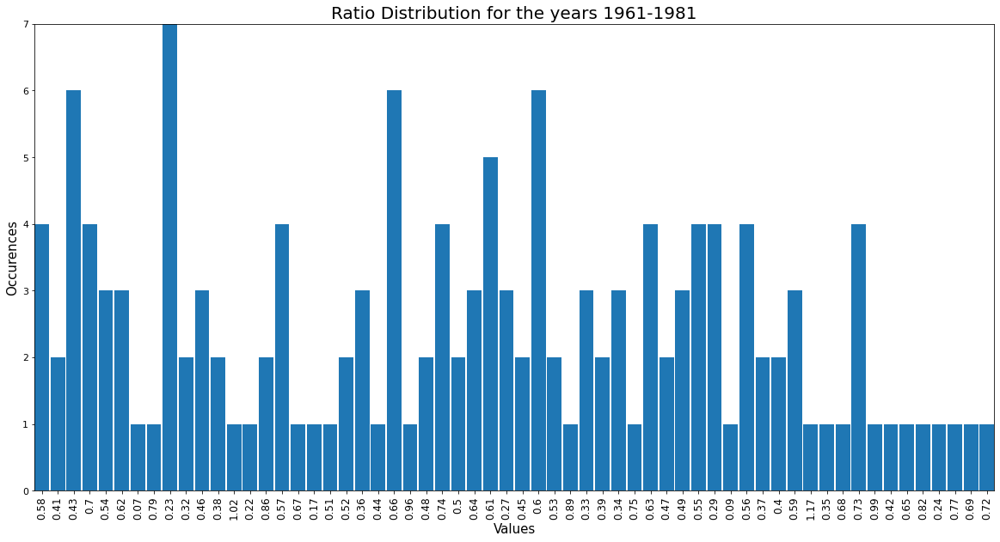

In [62]:
ratio_distribution_histogram(occurrences_inc_r1, title="Ratio Distribution for the years 1961-1981")

The order of the values doesn't follow any pattern. They are just all over the place. While looking like this we can only determine the value with the most occurences. It is impossible to find the skewness of the distribution. For this reason I am going to sort both dictionaris by the values.

In [63]:
occurrences_inc_r1_sorted = {k: v for k, v in sorted(occurrences_inc_r1.items(), key=lambda item: item[0])}
occurrences_inc_r2_sorted = {k: v for k, v in sorted(occurrences_inc_r2.items(), key=lambda item: item[0])}

In [64]:
occurrences_inc_r1_sorted

{0.07: 1,
 0.09: 1,
 0.17: 1,
 0.22: 1,
 0.23: 7,
 0.24: 1,
 0.27: 3,
 0.29: 4,
 0.32: 2,
 0.33: 3,
 0.34: 3,
 0.35: 1,
 0.36: 3,
 0.37: 2,
 0.38: 2,
 0.39: 2,
 0.4: 2,
 0.41: 2,
 0.42: 1,
 0.43: 6,
 0.44: 1,
 0.45: 2,
 0.46: 3,
 0.47: 2,
 0.48: 2,
 0.49: 3,
 0.5: 2,
 0.51: 1,
 0.52: 2,
 0.53: 2,
 0.54: 3,
 0.55: 4,
 0.56: 4,
 0.57: 4,
 0.58: 4,
 0.59: 3,
 0.6: 6,
 0.61: 5,
 0.62: 3,
 0.63: 4,
 0.64: 3,
 0.65: 1,
 0.66: 6,
 0.67: 1,
 0.68: 1,
 0.69: 1,
 0.7: 4,
 0.72: 1,
 0.73: 4,
 0.74: 4,
 0.75: 1,
 0.77: 1,
 0.79: 1,
 0.82: 1,
 0.86: 2,
 0.89: 1,
 0.96: 1,
 0.99: 1,
 1.02: 1,
 1.17: 1}

Let's take a look at both distributions after these changes.

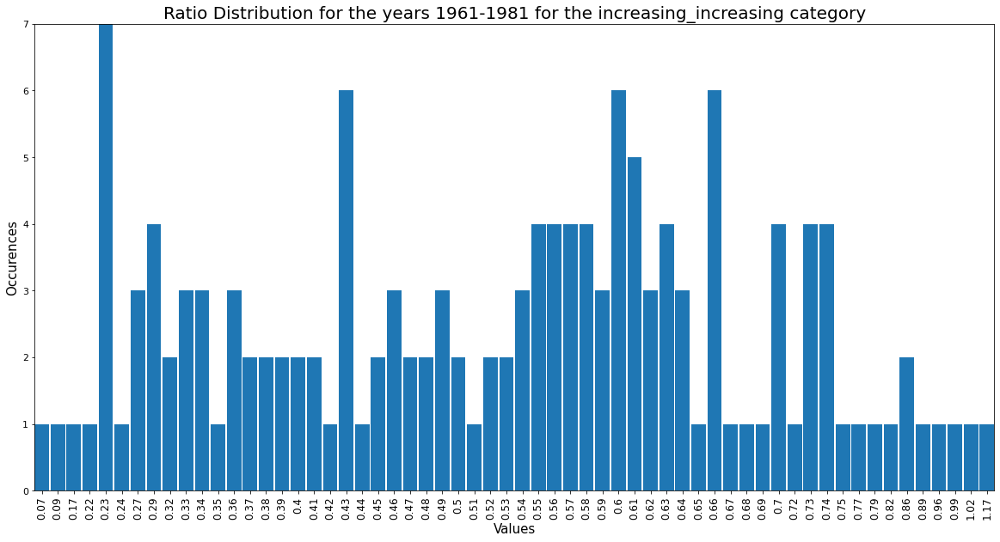

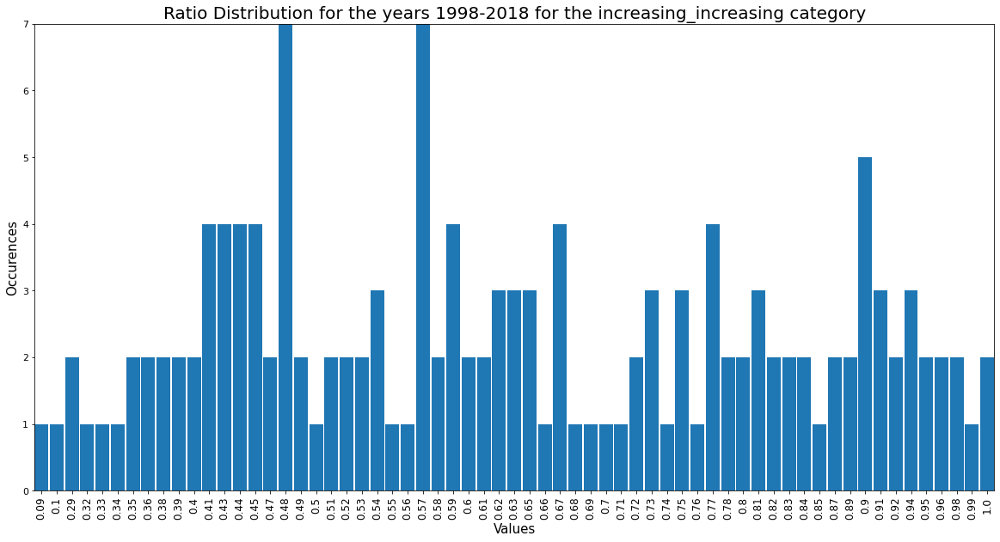

In [65]:
ratio_distribution_histogram(occurrences_inc_r1_sorted, title="Ratio Distribution for the years 1961-1981 for the increasing_increasing category")
ratio_distribution_histogram(occurrences_inc_r2_sorted, title="Ratio Distribution for the years 1998-2018 for the increasing_increasing category")

A quick recap - these values show us the rate of which the meat production has changed for the time period. Currently we are only analysing countries from the increasing_increasing category. 

Let's analyse the plots. The distribution for the years 1961-1981 doesn't have a very well formed peak, but it is visible. It starts from the **0.52** and ends at the **0.64** values. The mode of the distribution is **0.23** - 7 countries have this growth rate. However if we look to the left we can see a strange peak that has no higher values before or after it. We classify this value as an **outlier**. There are few of those in the first plot - **0.23**, **0.43**, **0.66**. It's hard to determine the skewness. I would say that it is skewed to the right, meaning that on avarage the meat production in this period was growing more. There are the larger values. Many of the values have only 1 occurence, making it the avarage minimum for the distribution.

Now let't take a look at the distribution for the years 1998-2018. At first look it is all over the place. The first thing I noticed is that the avarage minimum here is higher. Most of the low values have 2 occurences and very few have only 1. There are **2** values with the peak occurence - 7 (same as the first distribution). They are the the values **0.48**, **0.57**. On this distribution is impossible for me to determine the peak. There are at leatst 2. Here it is much harder to determine the skewness because of the distribution noice. If the first one is skewed to the right, this one should be classified as Multimodal. (I am using [this](https://diagrammm.com/histogram) website as a reference).

In the following cell I did the same operations for the **increasing_decreasing** category of countries. They are explained in less detail.

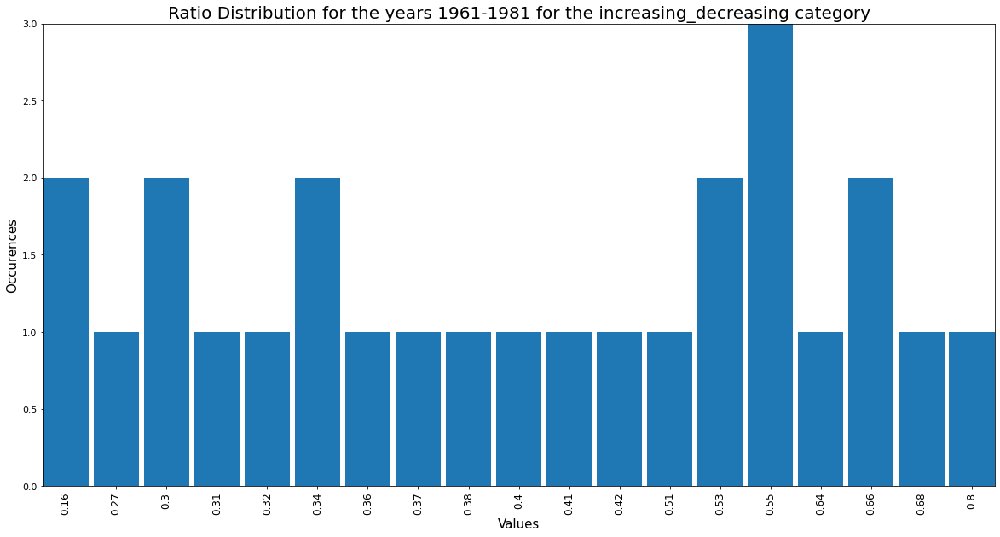

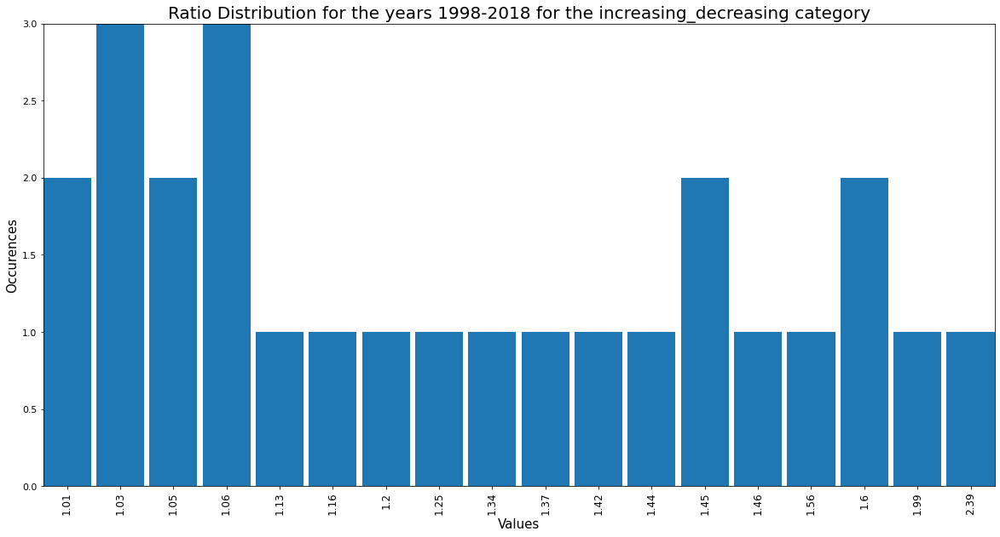

In [66]:
inc_dec_r1 = []
inc_dec_r2 = []

for i in range(1, len(increasing_decreasing_meat)+1):
    
    country = increasing_decreasing_meat[i-1] # Contains the index of the current country for plotting
    country_data = meat_production_data.loc[country]
    
    # Getting the tonnes for each needed year
    tonnes_year_1961 = country_data.loc[country_data["Year"] == 1961, "Tonnes"].item()
    tonnes_year_1981 = country_data.loc[country_data["Year"] == 1981, "Tonnes"].item()
    tonnes_year_1998 = country_data.loc[country_data["Year"] == 1998, "Tonnes"].item()
    tonnes_year_2018 = country_data.loc[country_data["Year"] == 2018, "Tonnes"].item()
    
    r1 = round(tonnes_year_1961/tonnes_year_1981, 2) # Ratio for the year period 1961-1981
    r2 = round(tonnes_year_1998/tonnes_year_2018, 2) # Ratio for the year period 1998-2018
    
    inc_dec_r1.append(r1)
    inc_dec_r2.append(r2)
    
occurrences_dec_r1 = Counter(inc_dec_r1)
occurrences_dec_r2 = Counter(inc_dec_r2)

occurrences_dec_r1_sorted = {k: v for k, v in sorted(occurrences_dec_r1.items(), key=lambda item: item[0])}
occurrences_dec_r2_sorted = {k: v for k, v in sorted(occurrences_dec_r2.items(), key=lambda item: item[0])}

ratio_distribution_histogram(occurrences_dec_r1_sorted, title="Ratio Distribution for the years 1961-1981 for the increasing_decreasing category")
ratio_distribution_histogram(occurrences_dec_r2_sorted, title="Ratio Distribution for the years 1998-2018 for the increasing_decreasing category")

First of all, the obvious - there are a much less values. There are 149 countries in the category increasing_increasing and only 26 in the category increasing_decreasing. Let's take a look at the first plot. Here it is much easier to determine the peak - it is in the right side of the plot and starts from **0.53** and ends at **0.64**. The mode of this distribution is **0.55** - 3 countries have this value. On the left side there are some spikes, but the values are not high enought to calssified as outliers. We can say that the skewnes of the first plot is to the right. 

The second plot is the opposite. The peak is at the very left, but has some spikes at the right side. There are actually two peaks - at **1.03** and **1.06**. They are both equal to the mode of this distribution - 3. The skewnessof this plot is towards the left.

With this data we can finally answer the final question of this chapter. Meat consumption is **NOT** increasing equaly for all countries. This would have been the case if the distributions were Symmetric or Gaussian distribution with very steap peak and thin tails. However, this is not the case.

### Chapter summary
We started by declaring 4 questions that need to be answered. Then we found and cleaned dataset about the meat production for every country. After this was a analysis of the global data. Then we found and cleaned a dataset about the world population. After some analysis of the data we found out that the meat production globally is increasing, but it is dependent on the human population. After this we started the analysis for each country separately. We saw plots of the meat production of every country/region we have data about. Then we categorised the countries by meat production increase/decrease and found out that most of the countries in the world are increasing their meat production. Then we calculated the growth ratios for the 2 increasing groups and plotted the data. The conclusion was that meat production is not growing equaly for every country.

## What effect meat consumption has on the enviroment
I am not by any means an expertin this area. I have to trust previous research and papers. Of course I didn't take for granted the first paper that I read. I did some research on the topic on my own. I want to make a huge disclamer before I start reffering to datasources. The topics of animal suffering, ethicality and animal rights are not the point of this research. I am interested in the data for pollution and I want to see if I can find a correlation between the meat production and the pollution in an area.

After many read articles I found some that very well sum all of the others up. I will be linking each of them when I use data from them, as well as in the Refferances at the end of the notebook.

So, meat. It comes from animals. To get more animals they are breeded. After a new animal is born it has go grow until it is ready to be eaten. It has to eat, dring water and live somewhere until that happens. The animal consumes vegetable food, which we can consume as well. So basicly what happens is we add a middleman. Instead of getting our food directly from the vegetable source, we use it to feed and give water to an animal for many years. But is it worth it? To find out I decided to see how much food is needed to grow different animals until they are ready to be eaten. If it is proportionally correct (for example 1:1) there should be no problem. 

Let's start with water. I coundn't find any good way to analyse the water polution in the way I want, so I will just find how much more food we can produce if we use the same amount of water for vegetables. In [this](https://www.theguardian.com/news/2018/may/07/true-cost-of-eating-meat-environment-health-animal-welfare) article by [The Guardian](https://www.theguardian.com/international) are explained the economics of meat production, as well as some of the enviromental impact. I used some of the reffered sources in it.


### Water
I don't want to analyse in depth the water pollution, because there are too many factors that cannot be traced at once just by me. I want to see how we use this precious resource. Can we do more with it than grow animals? This is the question we are answering in this sub chapter. 

**The Data**

The article mentioned before links ot [this](https://waterfootprint.org/en/water-footprint/product-water-footprint/water-footprint-crop-and-animal-products/) other article by [The Water Footprint Network](https://waterfootprint.org/en/) - a platform which's objective is to find solutions for the world's water problems. In it is a very interesting picture showing how much water is needed to grow different vegetable and meat types. As a source for the picture is linked [this article](https://waterfootprint.org/media/downloads/Report-48-WaterFootprint-AnimalProducts-Vol1_1.pdf) You can see the picture below.

In [68]:
data_picture = Image(filename="media/WFN data table.png", width=500, height=500) # Source: https://waterfootprint.org/en/water-footprint/product-water-footprint/water-footprint-crop-and-animal-products/

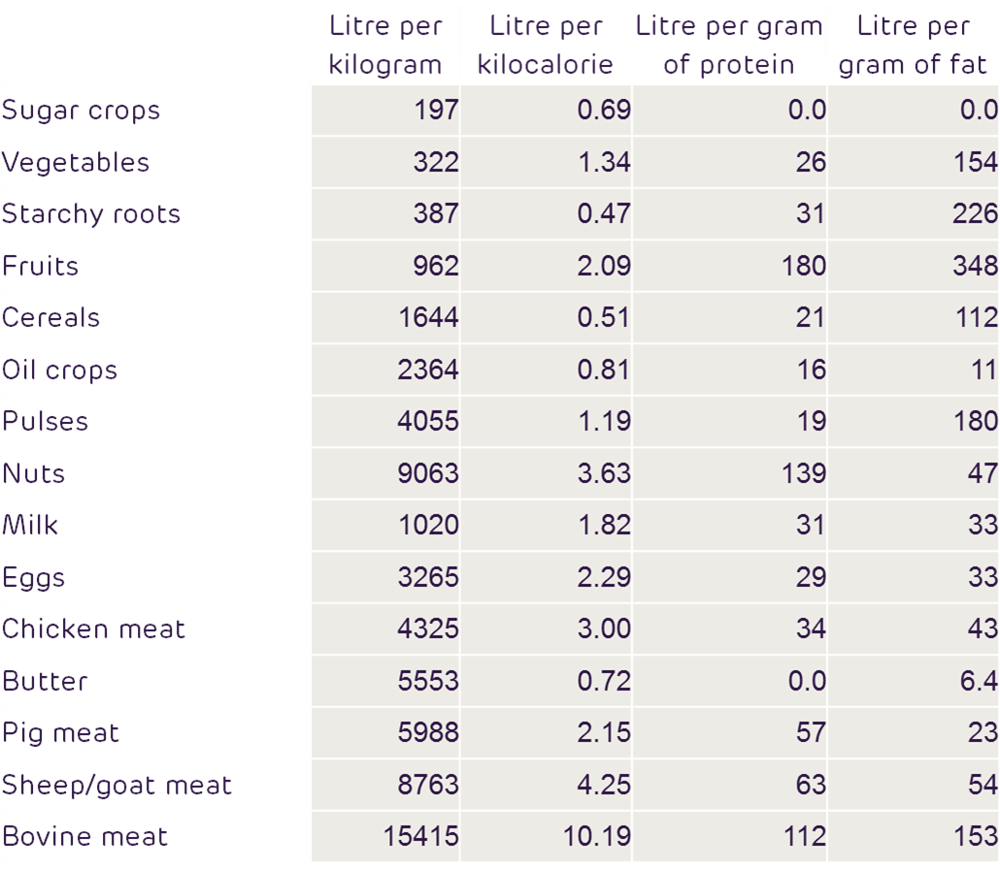

In [69]:
data_picture

Unfortunetly the data is avaible only in a picture, so I will extract the needed data manually. Since we already have the data for meat production in tonnes, I think it is best to ignore the kilocalorie, protein and fat columns. As I said I don't want to get into nutritional science. Let's focus on the kilogram column (the first one). Imagine that we ***.drop()*** the other columns. On avarage we use **322** litres of water to make **1** kilogram of vegetables (the data is generalized, some vegetables need more than others). To get the same amount of pig meat we will have to use **5988** litres of water! It is even more for sheep and goat meat - **8763** and for 1 kilogram of novine meat we use the whopping **15415** litres of water. The cheapest meat we can get in terms of water use is the chicken - **4325** litres per kilogram. Let's get the average of those 4 categories, supposed we produce equal amounts of each meat type.

$$\frac{4325 + 5988 + 8763 + 15,415}{4} = \frac{34,491}{4} = 8623$$

From the data analysis of the meat production dataset from the previous chapter we found that the meat production for 2018 is **317,448,242** tonnes. Since this data is in tonnes and the water usage data is in kilograms, I decided to change it to tonnes as well. If I change the tonnes to kilograms the numbers will become too big to make easy calculations. After multiplying by 1000 we will get the liters per tonne variable.

In [70]:
liters_per_kilo_meat = 8623
liters_per_tonne_meat = liters_per_kilo_meat * 1000

In [71]:
liters_per_tonne_meat

8623000

**8,623,000** - this is how many liters of water we use to make a tonne of meat. Let's calculate how much water is used for meat production in 2018 alone.

In [72]:
water_used_2018_meat = 317448242 * liters_per_tonne_meat

water_used_2018_meat

2737356190766000

**2,737,356,190,766,000** litres of water were used for meat production in 2018 alone. Let's find how much vegetables can be produced with this amount of water.

In [73]:
liters_per_kilo_vegetable = 322
liters_per_tonne_vegetable = liters_per_kilo_vegetable * 1000

n_vegetables = water_used_2018_meat/liters_per_tonne_vegetable

n_vegetables

8501106182.503105

With the same amount of water we could have produced **8,501,106,182** tonnes of different vegetables, instead of the **1,476,170,798** of meat.

$$\frac{8,501,106,182}{317,448,242} = 26.7$$

This is **26.7** times more food in terms of quantity. This shows that if we really have problem with the food we produce and it is not enough, we should produce more vegetables. It is more food for the less. I don't want to get into nutritional data, etc. This is not the goal of this research. For now it is enough to know that we can produce much more with the same resourse. I tend to forget that our resources are not infinite.

### CO2 Emissions
Everybody knows that the gas  **[Carbon dioxide (CO2)](https://en.wikipedia.org/wiki/Carbon_dioxide)** is one of the main gases in the **[Greenhouse gases](https://en.wikipedia.org/wiki/Greenhouse_gas)** group. It is well known that they are one of the main causes of the **[Greenhouse effect](https://en.wikipedia.org/wiki/Greenhouse_effect)**. This effect itself is one of the main causes of **[Global warming](https://en.wikipedia.org/wiki/Global_warming)**. If for some reason you are not familiar with **Climate change** and **Global warming**, I recommend you read **[this article](https://climate.nasa.gov/resources/global-warming-vs-climate-change/)** by **[NASA](https://www.nasa.gov/)**. It is very short and well-structured. It shows the difference between the different terms that sometimes get mixed together. There have been countless researches on this topic and I don't think I need to waste time proving it in this project. At this point it is so well known to us, that nowdays it is more considered as a fact, than assumption.

For this reasons I will focus only on **CO2**. The goal of this sub chapter and the whole project in genera is to find if there is a corelation between the **meat production** and **CO2** emissions in different areas.

**The Data**

After looking at some datasets I decided to use the data from **The World Bank**. Many other sources linked to their data, which makes me think that it is reliable. When looking for data I always try to go to the main source, so I don't end up checking and comparing data that is extracted from the same source. 

[This](https://data.worldbank.org/indicator/EN.ATM.CO2E.PC) is the dataset I decided to use. The values in it are in metric tons per capita, but I will calculate the total, since I have the data for the population of each country.

In [74]:
co2_emisions_data = pd.read_csv("data/co2 emissions data.csv")

In [75]:
co2_emisions_data

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,Unnamed: 64
0,Aruba,ABW,CO2 emissions (metric tons per capita),EN.ATM.CO2E.PC,204.620372,208.822811,226.118079,214.800370,207.615777,185.203957,...,24.507516,13.157722,8.353561,8.410064,8.610374,8.426911,NaN,NaN,NaN,NaN
1,Afghanistan,AFG,CO2 emissions (metric tons per capita),EN.ATM.CO2E.PC,0.046057,0.053589,0.073721,0.074161,0.086174,0.101285,...,0.406424,0.345149,0.280455,0.253728,0.262556,0.245101,NaN,NaN,NaN,NaN
2,Angola,AGO,CO2 emissions (metric tons per capita),EN.ATM.CO2E.PC,0.100835,0.082204,0.210531,0.202737,0.213560,0.205891,...,1.262825,1.361181,1.295075,1.664741,1.240245,1.202861,NaN,NaN,NaN,NaN
3,Albania,ALB,CO2 emissions (metric tons per capita),EN.ATM.CO2E.PC,1.258195,1.374186,1.439956,1.181681,1.111742,1.166099,...,1.803715,1.697966,1.697279,1.900070,1.602648,1.577163,NaN,NaN,NaN,NaN
4,Andorra,AND,CO2 emissions (metric tons per capita),EN.ATM.CO2E.PC,NaN,NaN,NaN,NaN,NaN,NaN,...,5.867410,5.916884,5.901775,5.832906,5.969786,6.072370,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,Kosovo,XKX,CO2 emissions (metric tons per capita),EN.ATM.CO2E.PC,NaN,NaN,NaN,NaN,NaN,NaN,...,4.672303,4.395272,4.441262,4.005283,4.702186,5.031520,NaN,NaN,NaN,NaN
260,"Yemen, Rep.",YEM,CO2 emissions (metric tons per capita),EN.ATM.CO2E.PC,0.011038,0.013599,0.012729,0.014518,0.017550,0.017926,...,0.865783,0.764021,1.013754,0.955251,0.497091,0.390480,NaN,NaN,NaN,NaN
261,South Africa,ZAF,CO2 emissions (metric tons per capita),EN.ATM.CO2E.PC,5.727221,5.832621,5.887170,5.961336,6.332342,6.616544,...,9.179457,8.794997,8.553336,8.882322,8.376655,8.480658,NaN,NaN,NaN,NaN
262,Zambia,ZMB,CO2 emissions (metric tons per capita),EN.ATM.CO2E.PC,NaN,NaN,NaN,NaN,0.946606,1.096876,...,0.208412,0.254267,0.265078,0.292412,0.285428,0.314183,NaN,NaN,NaN,NaN


**Cleaning**

The dataset is covering the same years as our meat production dataset. In the next cell I am checking the shape and datatypes of each column. 

The **Indicator Name** and  **Indicator Code** are unnecessary. We already know what the indicator is - metric tonns per capita. We also don't need the data for the years **1960** and **2019**, since they are not in our meat production and human population datasets. After checking the shape and data types of each column, I will remove those useless for my research columns.

In [76]:
co2_emisions_data.shape

(264, 65)

In [77]:
co2_emisions_data.dtypes

Country Name       object
Country Code       object
Indicator Name     object
Indicator Code     object
1960              float64
                   ...   
2016              float64
2017              float64
2018              float64
2019              float64
Unnamed: 64       float64
Length: 65, dtype: object

Everything looks OK here. The next cell removes the unwanted columns. Just as with the other dataset, I will make a copy of it and work on it. I want to have the original data saved somewhere in case I need it.

In [78]:
# Removing the unnecessary columns
co2_emisions_data = co2_emisions_data.drop(["Indicator Name", "Indicator Code", 
                                                "1960", "2019", "Unnamed: 64"], axis = 1)

global_co2_emisions = co2_emisions_data

In [79]:
global_co2_emisions

,Country Name,Country Code,1961,1962,1963,1964,1965,1966,1967,1968,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
0,Aruba,ABW,208.822811,226.118079,214.800370,207.615777,185.203957,172.119951,210.779072,194.887490,...,25.915322,24.670529,24.507516,13.157722,8.353561,8.410064,8.610374,8.426911,NaN,NaN
1,Afghanistan,AFG,0.053589,0.073721,0.074161,0.086174,0.101285,0.107399,0.123410,0.115142,...,0.238399,0.289988,0.406424,0.345149,0.280455,0.253728,0.262556,0.245101,NaN,NaN
2,Angola,AGO,0.082204,0.210531,0.202737,0.213560,0.205891,0.268941,0.172102,0.289718,...,1.234425,1.244092,1.262825,1.361181,1.295075,1.664741,1.240245,1.202861,NaN,NaN
3,Albania,ALB,1.374186,1.439956,1.181681,1.111742,1.166099,1.333055,1.363746,1.519551,...,1.495600,1.578574,1.803715,1.697966,1.697279,1.900070,1.602648,1.577163,NaN,NaN
4,Andorra,AND,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,6.121580,6.122595,5.867410,5.916884,5.901775,5.832906,5.969786,6.072370,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,Kosovo,XKX,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.650695,4.745656,4.672303,4.395272,4.441262,4.005283,4.702186,5.031520,NaN,NaN
260,"Yemen, Rep.",YEM,0.013599,0.012729,0.014518,0.017550,0.017926,0.017023,0.017380,0.021384,...,1.090990,1.011975,0.865783,0.764021,1.013754,0.955251,0.497091,0.390480,NaN,NaN
261,South Africa,ZAF,5.832621,5.887170,5.961336,6.332342,6.616544,6.453861,6.560824,6.593620,...,9.967159,9.173055,9.179457,8.794997,8.553336,8.882322,8.376655,8.480658,NaN,NaN
262,Zambia,ZMB,NaN,NaN,NaN,0.946606,1.096876,0.951121,1.261961,1.166853,...,0.189800,0.197823,0.208412,0.254267,0.265078,0.292412,0.285428,0.314183,NaN,NaN


The dataframe looks much better. The following cell shows us the number of countries in the dataframe.



In [80]:
all_uniques_countries_co2 = global_co2_emisions["Country Name"].unique() # Getting all countries

for country in all_uniques_countries_co2:
    print(country)

Aruba
Afghanistan
Angola
Albania
Andorra
Arab World
United Arab Emirates
Argentina
Armenia
American Samoa
Antigua and Barbuda
Australia
Austria
Azerbaijan
Burundi
Belgium
Benin
Burkina Faso
Bangladesh
Bulgaria
Bahrain
Bahamas, The
Bosnia and Herzegovina
Belarus
Belize
Bermuda
Bolivia
Brazil
Barbados
Brunei Darussalam
Bhutan
Botswana
Central African Republic
Canada
Central Europe and the Baltics
Switzerland
Channel Islands
Chile
China
Cote d'Ivoire
Cameroon
Congo, Dem. Rep.
Congo, Rep.
Colombia
Comoros
Cabo Verde
Costa Rica
Caribbean small states
Cuba
Curacao
Cayman Islands
Cyprus
Czech Republic
Germany
Djibouti
Dominica
Denmark
Dominican Republic
Algeria
East Asia & Pacific (excluding high income)
Early-demographic dividend
East Asia & Pacific
Europe & Central Asia (excluding high income)
Europe & Central Asia
Ecuador
Egypt, Arab Rep.
Euro area
Eritrea
Spain
Estonia
Ethiopia
European Union
Fragile and conflict affected situations
Finland
Fiji
France
Faroe Islands
Micronesia, Fed. Sts.


In [81]:
number_of_co2_countries = len(all_uniques_countries_co2)

number_of_co2_countries

264

There are **264** countris in this dataset. They are in alphabetical order. Just as the meat production, there are values here which are for whole regions/continents - **East Asia & Pacific (excluding high income), Europe & Central Asiam, etc.** We don't want them because the data is doubled - once in all the countries in this region and then the region itself. I cannot remove them automaticaly for the same reason as before. If I delete every value starting with South I will delete the region South Eastern Asia, which we dont want, but I will delete South Korea and South Africa, which are countries. This time I don't have to go through every single value and make a list of them. I will just compart the data from here with the data from the meat production dataset. **Every country that doesn't exist in the meat production dataframe will be removed**. This way we will have left only the data for the countries that we already have.

The following code gets every value from the meat_production_data dataframe and stores it in a list.

In [82]:
all_uniques_countries_meat = meat_production_data.index.unique().tolist() # Getting all countries

all_uniques_countries_meat

['Afghanistan',
 'Albania',
 'Algeria',
 'American Samoa',
 'Angola',
 'Antigua and Barbuda',
 'Argentina',
 'Australia',
 'Austria',
 'Bahamas',
 'Bahrain',
 'Bangladesh',
 'Barbados',
 'Belize',
 'Benin',
 'Bermuda',
 'Bhutan',
 'Bolivia',
 'Botswana',
 'Brazil',
 'British Virgin Islands',
 'Brunei',
 'Bulgaria',
 'Burkina Faso',
 'Burundi',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Cape Verde',
 'Central African Republic',
 'Chad',
 'Chile',
 'China',
 'Colombia',
 'Comoros',
 'Congo',
 'Cook Islands',
 'Costa Rica',
 "Cote d'Ivoire",
 'Cuba',
 'Cyprus',
 'Democratic Republic of Congo',
 'Denmark',
 'Djibouti',
 'Dominica',
 'Dominican Republic',
 'Ecuador',
 'Egypt',
 'El Salvador',
 'Equatorial Guinea',
 'Falkland Islands',
 'Fiji',
 'Finland',
 'France',
 'French Guiana',
 'French Polynesia',
 'Gabon',
 'Gambia',
 'Germany',
 'Ghana',
 'Greece',
 'Greenland',
 'Grenada',
 'Guadeloupe',
 'Guam',
 'Guatemala',
 'Guinea',
 'Guinea-Bissau',
 'Guyana',
 'Haiti',
 'Honduras',
 'Hong Kong'

Now we will go through the whole dataframe for CO2 emissions and if a value is in this list it is kept, otherwise it is removed. The ***errors="ignore"*** parameter on the ***.drop()*** function is needed because there are countries in the CO2 data that don't even exist in the meat production data. This make it so they are just skipped instead of raising value error.

In [83]:
all_co2_countries = global_co2_emisions["Country Name"].unique().tolist()

In [84]:
for country in all_co2_countries:
    
    if country in all_uniques_countries_meat:
        pass
    else:
        invalid_index = global_co2_emisions[global_co2_emisions["Country Name"] == country].index
        global_co2_emisions = global_co2_emisions.drop(invalid_index, errors='ignore')

The shape before was **(264, 65)**, let's check it again to be sure that values were removed.

In [85]:
global_co2_emisions.shape

(145, 60)

There are **119** less countries! The next step is to check for missing values.

In [86]:
global_co2_emisions.isnull().values.any() # Checking for missing values

True

In [87]:
global_co2_emisions[global_co2_emisions.isnull().any(axis=1)]

,Country Name,Country Code,1961,1962,1963,1964,1965,1966,1967,1968,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
1,Afghanistan,AFG,0.053589,0.073721,0.074161,0.086174,0.101285,0.107399,0.123410,0.115142,...,0.238399,0.289988,0.406424,0.345149,0.280455,0.253728,0.262556,0.245101,NaN,NaN
2,Angola,AGO,0.082204,0.210531,0.202737,0.213560,0.205891,0.268941,0.172102,0.289718,...,1.234425,1.244092,1.262825,1.361181,1.295075,1.664741,1.240245,1.202861,NaN,NaN
3,Albania,ALB,1.374186,1.439956,1.181681,1.111742,1.166099,1.333055,1.363746,1.519551,...,1.495600,1.578574,1.803715,1.697966,1.697279,1.900070,1.602648,1.577163,NaN,NaN
6,United Arab Emirates,ARE,0.109141,0.163533,0.175833,0.132825,0.146820,0.160455,5.399921,6.806841,...,21.253891,18.552473,19.183065,24.043137,23.996002,24.543043,21.026392,22.040829,NaN,NaN
7,Argentina,ARG,2.458551,2.538446,2.330685,2.553442,2.656466,2.806896,2.871100,2.981777,...,4.445388,4.606804,4.644106,4.625260,4.589774,4.588230,4.664011,4.619085,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,Vietnam,VNM,0.183099,0.217694,0.196997,0.209870,0.217934,0.225434,0.195461,0.203764,...,1.476951,1.622619,1.712241,1.588282,1.622308,1.824532,2.032108,2.057566,NaN,NaN
256,Vanuatu,VUT,NaN,0.594994,0.471835,0.864439,0.641861,1.008011,1.074421,0.772890,...,0.525570,0.512300,0.544036,0.455621,0.414375,0.583634,0.486896,0.527000,NaN,NaN
258,Samoa,WSM,0.163552,0.158366,0.184026,0.208112,0.230894,0.196437,0.191307,0.213373,...,1.013335,1.005744,1.075831,1.047227,1.038282,1.087389,1.212776,1.262955,NaN,NaN
262,Zambia,ZMB,NaN,NaN,NaN,0.946606,1.096876,0.951121,1.261961,1.166853,...,0.189800,0.197823,0.208412,0.254267,0.265078,0.292412,0.285428,0.314183,NaN,NaN


According to this all countries have missing values. Upon further inspectio I saw that all the countries miss the values for the last two years - **2017** and **2018**. Since they don't provide any value I will remove them.

In [88]:
global_co2_emisions = global_co2_emisions.drop(["2017", "2018"], axis = 1)

In [89]:
global_co2_emisions

,Country Name,Country Code,1961,1962,1963,1964,1965,1966,1967,1968,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
1,Afghanistan,AFG,0.053589,0.073721,0.074161,0.086174,0.101285,0.107399,0.123410,0.115142,...,0.083893,0.151721,0.238399,0.289988,0.406424,0.345149,0.280455,0.253728,0.262556,0.245101
2,Angola,AGO,0.082204,0.210531,0.202737,0.213560,0.205891,0.268941,0.172102,0.289718,...,1.203134,1.185000,1.234425,1.244092,1.262825,1.361181,1.295075,1.664741,1.240245,1.202861
3,Albania,ALB,1.374186,1.439956,1.181681,1.111742,1.166099,1.333055,1.363746,1.519551,...,1.322335,1.484311,1.495600,1.578574,1.803715,1.697966,1.697279,1.900070,1.602648,1.577163
6,United Arab Emirates,ARE,0.109141,0.163533,0.175833,0.132825,0.146820,0.160455,5.399921,6.806841,...,21.974045,22.169110,21.253891,18.552473,19.183065,24.043137,23.996002,24.543043,21.026392,22.040829
7,Argentina,ARG,2.458551,2.538446,2.330685,2.553442,2.656466,2.806896,2.871100,2.981777,...,4.414246,4.718224,4.445388,4.606804,4.644106,4.625260,4.589774,4.588230,4.664011,4.619085
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,Vietnam,VNM,0.183099,0.217694,0.196997,0.209870,0.217934,0.225434,0.195461,0.203764,...,1.227734,1.368182,1.476951,1.622619,1.712241,1.588282,1.622308,1.824532,2.032108,2.057566
256,Vanuatu,VUT,NaN,0.594994,0.471835,0.864439,0.641861,1.008011,1.074421,0.772890,...,0.451124,0.424300,0.525570,0.512300,0.544036,0.455621,0.414375,0.583634,0.486896,0.527000
258,Samoa,WSM,0.163552,0.158366,0.184026,0.208112,0.230894,0.196437,0.191307,0.213373,...,0.946733,0.980465,1.013335,1.005744,1.075831,1.047227,1.038282,1.087389,1.212776,1.262955
262,Zambia,ZMB,NaN,NaN,NaN,0.946606,1.096876,0.951121,1.261961,1.166853,...,0.154271,0.168958,0.189800,0.197823,0.208412,0.254267,0.265078,0.292412,0.285428,0.314183


The following code checks for missing values again.

In [90]:
global_co2_emisions[global_co2_emisions.isnull().any(axis=1)]

,Country Name,Country Code,1961,1962,1963,1964,1965,1966,1967,1968,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
9,American Samoa,ASM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14,Burundi,BDI,NaN,0.015136,0.016081,0.015752,0.011851,0.015036,0.014653,0.016484,...,0.023787,0.023466,0.022707,0.035505,0.047483,0.042040,0.043049,0.039112,0.039702,0.047201
30,Bhutan,BTN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.590139,0.627899,0.573034,0.711464,1.057842,1.191699,1.295928,1.443227,1.466042,1.712274
31,Botswana,BWA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.256364,2.352606,1.989774,2.299366,2.001437,2.491951,2.748646,3.283177,2.560846,2.935374
53,Germany,DEU,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,9.496554,9.490869,8.797642,9.267661,9.091375,9.177916,9.398672,8.895302,8.900419,8.840129
75,France,FRA,5.952752,6.235409,6.875293,7.013993,7.062751,6.899141,7.326519,7.515932,...,5.766385,5.690502,5.438357,5.428981,5.077911,5.075062,5.062172,4.573460,NaN,NaN
91,Guam,GUM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
114,Italy,ITA,2.464556,2.878496,3.215100,3.405053,3.641502,4.079441,4.431483,4.686613,...,7.917347,7.601765,6.795651,6.838375,6.702558,6.205414,5.732942,5.270867,NaN,NaN
125,Kuwait,KWT,33.208154,42.360705,44.953296,59.767451,75.035544,67.190647,44.080445,35.459117,...,30.046034,31.148685,30.947374,29.956090,27.353820,30.015094,26.889159,23.942684,24.242449,24.952513
139,Lesotho,LSO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.044592,1.070318,1.114768,1.141125,1.162072,1.190189,1.194905,1.189770,1.139804,1.210551


Some countries like **Botswana** have a lot of missing values. However, other countries like **France** are missing very few values. The countries missing too many or all values to be kept are **American Samoa, Bhutan, Germany, Guam, Lesotho, Maldives, Namibia, Nauru, Oman, Puerto Rico, Tuvalu**. In the following cell I will remove them and then I will decide what to do with the other ones.

In [91]:
countries_missing_values = ["American Samoa", "Bhutan", "Germany", "Guam", 
                            "Lesotho", "Maldives", "Namibia", "Nauru", 
                            "Oman", "Puerto Rico", "Tuvalu"]

for country in countries_missing_values:
    
    invalid_index = global_co2_emisions[global_co2_emisions["Country Name"] == country].index
    global_co2_emisions = global_co2_emisions.drop(invalid_index, errors='ignore')

In [92]:
global_co2_emisions

,Country Name,Country Code,1961,1962,1963,1964,1965,1966,1967,1968,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
1,Afghanistan,AFG,0.053589,0.073721,0.074161,0.086174,0.101285,0.107399,0.123410,0.115142,...,0.083893,0.151721,0.238399,0.289988,0.406424,0.345149,0.280455,0.253728,0.262556,0.245101
2,Angola,AGO,0.082204,0.210531,0.202737,0.213560,0.205891,0.268941,0.172102,0.289718,...,1.203134,1.185000,1.234425,1.244092,1.262825,1.361181,1.295075,1.664741,1.240245,1.202861
3,Albania,ALB,1.374186,1.439956,1.181681,1.111742,1.166099,1.333055,1.363746,1.519551,...,1.322335,1.484311,1.495600,1.578574,1.803715,1.697966,1.697279,1.900070,1.602648,1.577163
6,United Arab Emirates,ARE,0.109141,0.163533,0.175833,0.132825,0.146820,0.160455,5.399921,6.806841,...,21.974045,22.169110,21.253891,18.552473,19.183065,24.043137,23.996002,24.543043,21.026392,22.040829
7,Argentina,ARG,2.458551,2.538446,2.330685,2.553442,2.656466,2.806896,2.871100,2.981777,...,4.414246,4.718224,4.445388,4.606804,4.644106,4.625260,4.589774,4.588230,4.664011,4.619085
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,Vietnam,VNM,0.183099,0.217694,0.196997,0.209870,0.217934,0.225434,0.195461,0.203764,...,1.227734,1.368182,1.476951,1.622619,1.712241,1.588282,1.622308,1.824532,2.032108,2.057566
256,Vanuatu,VUT,NaN,0.594994,0.471835,0.864439,0.641861,1.008011,1.074421,0.772890,...,0.451124,0.424300,0.525570,0.512300,0.544036,0.455621,0.414375,0.583634,0.486896,0.527000
258,Samoa,WSM,0.163552,0.158366,0.184026,0.208112,0.230894,0.196437,0.191307,0.213373,...,0.946733,0.980465,1.013335,1.005744,1.075831,1.047227,1.038282,1.087389,1.212776,1.262955
262,Zambia,ZMB,NaN,NaN,NaN,0.946606,1.096876,0.951121,1.261961,1.166853,...,0.154271,0.168958,0.189800,0.197823,0.208412,0.254267,0.265078,0.292412,0.285428,0.314183


In [93]:
global_co2_emisions.shape

(134, 58)

After this we are left with 134 countries. Let's display again the ones that are still missing a bit of values.

In [94]:
global_co2_emisions[global_co2_emisions.isnull().any(axis=1)]

,Country Name,Country Code,1961,1962,1963,1964,1965,1966,1967,1968,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
14,Burundi,BDI,NaN,0.015136,0.016081,0.015752,0.011851,0.015036,0.014653,0.016484,...,0.023787,0.023466,0.022707,0.035505,0.047483,0.042040,0.043049,0.039112,0.039702,0.047201
31,Botswana,BWA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.256364,2.352606,1.989774,2.299366,2.001437,2.491951,2.748646,3.283177,2.560846,2.935374
75,France,FRA,5.952752,6.235409,6.875293,7.013993,7.062751,6.899141,7.326519,7.515932,...,5.766385,5.690502,5.438357,5.428981,5.077911,5.075062,5.062172,4.573460,NaN,NaN
114,Italy,ITA,2.464556,2.878496,3.215100,3.405053,3.641502,4.079441,4.431483,4.686613,...,7.917347,7.601765,6.795651,6.838375,6.702558,6.205414,5.732942,5.270867,NaN,NaN
125,Kuwait,KWT,33.208154,42.360705,44.953296,59.767451,75.035544,67.190647,44.080445,35.459117,...,30.046034,31.148685,30.947374,29.956090,27.353820,30.015094,26.889159,23.942684,24.242449,24.952513
166,Malawi,MWI,NaN,NaN,NaN,0.081845,0.084259,0.101178,0.084290,0.087067,...,0.074210,0.081205,0.079423,0.072131,0.078182,0.075503,0.075010,0.064608,0.068762,0.075449
224,Seychelles,SYC,NaN,NaN,0.162343,0.158326,0.154400,0.150599,0.146942,0.143427,...,7.546776,7.970272,6.006793,4.942709,3.732380,4.775659,3.669079,5.338401,5.259936,6.390728
253,British Virgin Islands,VGB,NaN,0.441276,0.432633,0.848254,0.830578,1.218947,0.397636,1.556947,...,7.466643,7.306740,7.052184,7.124487,7.121897,7.039616,6.991542,7.336783,7.295760,7.245307
256,Vanuatu,VUT,NaN,0.594994,0.471835,0.864439,0.641861,1.008011,1.074421,0.772890,...,0.451124,0.424300,0.525570,0.512300,0.544036,0.455621,0.414375,0.583634,0.486896,0.527000
262,Zambia,ZMB,NaN,NaN,NaN,0.946606,1.096876,0.951121,1.261961,1.166853,...,0.154271,0.168958,0.189800,0.197823,0.208412,0.254267,0.265078,0.292412,0.285428,0.314183


After some concideration I decided to replace those missing values with the mean of the column. (I really wanted to replace them with the mean of the row, but I ran into problems with this. In the future I will try and fix it again.) The mean of all other countries should give us accurate data. The next column does this.  Many countries have missing values for the years **2015** and **2016** and if we do this for them basicly when plottet it will look like they are lowering in the recent years. That's why I am going to remove those columns as well and have more accurate data for less years.

In [95]:
global_co2_emisions = global_co2_emisions.drop(["2015", "2016"], axis = 1)
global_co2_emisions = global_co2_emisions.fillna(global_co2_emisions.mean())

Just to make sure, I will check if there are any missing values.

In [96]:
global_co2_emisions.isnull().values.any() # Checking for missing values

False

In [97]:
global_co2_emisions

,Country Name,Country Code,1961,1962,1963,1964,1965,1966,1967,1968,...,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014
1,Afghanistan,AFG,0.053589,0.073721,0.074161,0.086174,0.101285,0.107399,0.123410,0.115142,...,0.051744,0.062428,0.083893,0.151721,0.238399,0.289988,0.406424,0.345149,0.280455,0.253728
2,Angola,AGO,0.082204,0.210531,0.202737,0.213560,0.205891,0.268941,0.172102,0.289718,...,0.985736,1.105019,1.203134,1.185000,1.234425,1.244092,1.262825,1.361181,1.295075,1.664741
3,Albania,ALB,1.374186,1.439956,1.181681,1.111742,1.166099,1.333055,1.363746,1.519551,...,1.412498,1.302576,1.322335,1.484311,1.495600,1.578574,1.803715,1.697966,1.697279,1.900070
6,United Arab Emirates,ARE,0.109141,0.163533,0.175833,0.132825,0.146820,0.160455,5.399921,6.806841,...,25.297702,23.344186,21.974045,22.169110,21.253891,18.552473,19.183065,24.043137,23.996002,24.543043
7,Argentina,ARG,2.458551,2.538446,2.330685,2.553442,2.656466,2.806896,2.871100,2.981777,...,4.168129,4.465186,4.414246,4.718224,4.445388,4.606804,4.644106,4.625260,4.589774,4.588230
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,Vietnam,VNM,0.183099,0.217694,0.196997,0.209870,0.217934,0.225434,0.195461,0.203764,...,1.170708,1.214193,1.227734,1.368182,1.476951,1.622619,1.712241,1.588282,1.622308,1.824532
256,Vanuatu,VUT,2.015577,0.594994,0.471835,0.864439,0.641861,1.008011,1.074421,0.772890,...,0.280349,0.222377,0.451124,0.424300,0.525570,0.512300,0.544036,0.455621,0.414375,0.583634
258,Samoa,WSM,0.163552,0.158366,0.184026,0.208112,0.230894,0.196437,0.191307,0.213373,...,0.897739,0.912310,0.946733,0.980465,1.013335,1.005744,1.075831,1.047227,1.038282,1.087389
262,Zambia,ZMB,2.015577,2.105833,2.865057,0.946606,1.096876,0.951121,1.261961,1.166853,...,0.192996,0.188267,0.154271,0.168958,0.189800,0.197823,0.208412,0.254267,0.265078,0.292412


There is one last thing to do. Because now each year is a separate column, I will have to ***melt*** the table. It's format after the melting will be much easier to work with. Also I sorted the values by the **Country Name** column.

In [98]:
global_co2_emisions = pd.melt(global_co2_emisions, id_vars = ["Country Name", "Country Code"], var_name = "Year", value_name = "Value")
global_co2_emisions = global_co2_emisions.sort_values(by=["Year"])

In [99]:
global_co2_emisions

,Country Name,Country Code,Year,Value
0,Afghanistan,AFG,1961,0.053589
98,Papua New Guinea,PNG,1961,0.087801
97,Philippines,PHL,1961,0.321188
96,Peru,PER,1961,0.827360
95,Panama,PAN,1961,0.945724
...,...,...,...,...
7138,Algeria,DZA,2014,3.735803
7137,Dominican Republic,DOM,2014,2.178517
7136,Denmark,DNK,2014,5.873334
7150,Greece,GRC,2014,6.199527


**Analysis**

I will follow the same sequence of operations for analysing this dataset, as I did with the meat production one. This is to keep consistency in the project. I want to see how the quality of CO2 has increased over the years for each of the availble countries. First I had to group the data so it is ready for plotting.

In [100]:
total_co2 = global_co2_emisions.groupby("Year")["Value"].sum()

In [101]:
all_uniques_co2 = global_co2_emisions["Country Name"].unique().tolist() # Gets every unique country name value

def show_plots_co2(all_uniques_co2):
    for i in range(1, len(all_uniques_co2)+1):    

        country = all_uniques_co2[i-1] # Contains the index of the current country for plotting
        country_data = global_co2_emisions[global_co2_emisions["Country Name"] == country] # Contains the data for the current country for plotting

        ax = plt.subplot(64, 3, i)

        ax.plot(country_data["Year"], country_data["Value"], linewidth = 4) # Plotting the data
        
        ax.set_ylim(ymin=0)

        plt.margins(0)
        plt.xticks(range(1, 58, 4))
        
        plt.title(f"{country} CO2 emissions over time", fontsize=18)
        plt.xlabel("Years", fontsize=14)
        plt.ylabel("Metric tonnes [per capita]", fontsize=14)

    plt.show()

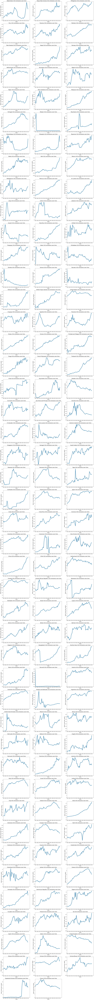

In [102]:
plt.figure(figsize=(28, 450))

show_plots_co2(all_uniques_co2)

You can take a look at each plot for yourself. If you remember we classified the countries by meat production in 4 categories:

    1.Countries with overall increase in meat production including recent years
    2.Countries with overall increase in meat production excluding recent years
    
    3.Countries with overall decrease in meat production including recent years
    4.Countries with overall decrease in meat production excluding recent years

We will do the same with the values for CO2. The rules for naming the lists are the same. The only think we have to do before classifying them is to make the column **Country Name** index. Also the years were ***floats***, but during the operations we did on the dataframe they have turned into strings.

In [103]:
global_co2_emisions.dtypes

Country Name     object
Country Code     object
Year             object
Value           float64
dtype: object

In [104]:
global_co2_emisions = global_co2_emisions.set_index(global_co2_emisions.columns[0])

global_co2_emisions[["Year", "Value"]] = global_co2_emisions[["Year", "Value"]].astype(float)

In [105]:
global_co2_emisions.dtypes

Country Code     object
Year            float64
Value           float64
dtype: object

In [106]:
global_co2_emisions

,Country Code,Year,Value
Country Name,,,
Afghanistan,AFG,1961.0,0.053589
Papua New Guinea,PNG,1961.0,0.087801
Philippines,PHL,1961.0,0.321188
Peru,PER,1961.0,0.827360
Panama,PAN,1961.0,0.945724
...,...,...,...
Algeria,DZA,2014.0,3.735803
Dominican Republic,DOM,2014.0,2.178517
Denmark,DNK,2014.0,5.873334


In [107]:
increasing_increasing_co2, increasing_decreasing_co2, decreasing_increasing_co2, decreasing_decreasing_co2 = ([], [], [], [])

In [108]:
for i in range(1, len(all_uniques_co2)):
    
    country = all_uniques_co2[i] # Contains the index of the current country for plotting
    country_data = global_co2_emisions.loc[country]
    
    # Getting the tonnes for each needed year
    amount_year_1961 = country_data.loc[country_data["Year"] == 1961, "Value"].item()
    amount_year_1998 = country_data.loc[country_data["Year"] == 1998, "Value"].item()
    amount_year_2014 = country_data.loc[country_data["Year"] == 2014, "Value"].item()
    
    # Determining the category
    
    if amount_year_1961 <= amount_year_2014:
        if amount_year_1998 <= amount_year_2014:
            increasing_increasing_co2.append(country)
        else:
            increasing_decreasing_co2.append(country)
    else:
        if amount_year_1998 <= amount_year_2014:
            decreasing_increasing_co2.append(country)
        else:
            decreasing_decreasing_co2.append(country)

Let's check which countrie went where.

<h3><center>Countries from the category increasing_increasing_co2</center></h3>

In [109]:
increasing_increasing_co2_value = len(increasing_increasing_co2) # Holds the number of countries in this category

print(f'{increasing_increasing_co2_value} out 134 of  are in the category "Countries with overall increase in CO2 emissions including recent years"')
print("\n")

for country in increasing_increasing_co2:
    print(country)

83 out 134 of  are in the category "Countries with overall increase in CO2 emissions including recent years"


Papua New Guinea
Philippines
Peru
Panama
Pakistan
Nepal
Norway
Nicaragua
Nigeria
Niger
New Caledonia
Malaysia
Mauritania
Mongolia
Myanmar
Mali
Madagascar
Morocco
Sri Lanka
Libya
Liberia
Mauritius
Kiribati
Samoa
Vietnam
British Virgin Islands
Uruguay
Uganda
Tanzania
Turkey
Tunisia
Trinidad and Tobago
Tonga
French Polynesia
Thailand
Chad
Sao Tome and Principe
Sierra Leone
Senegal
Saudi Arabia
Rwanda
Togo
Cambodia
Japan
Cuba
Costa Rica
Comoros
Colombia
Cameroon
Cote d'Ivoire
China
Chile
Botswana
Barbados
Brazil
Bolivia
Bangladesh
Burkina Faso
Benin
Antigua and Barbuda
Argentina
Albania
Bermuda
Djibouti
Angola
Dominica
Iraq
India
Indonesia
Haiti
Honduras
Guyana
Guatemala
Greenland
Jordan
Grenada
Algeria
Ecuador
Fiji
Ghana
Guinea
Guinea-Bissau
Equatorial Guinea


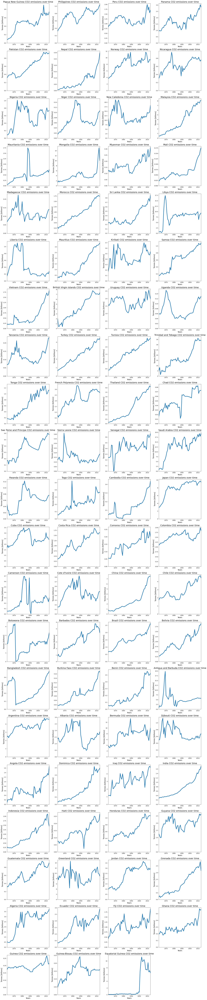

In [110]:
plt.figure(figsize=(28, 450))

show_plots_category(category=increasing_increasing_co2, dataframe=global_co2_emisions, 
                    title_data="CO2 emissions", secondary_value="Value")

<h3><center>Countries from the category increasing_decreasing_co2</center></h3>

In [111]:
increasing_decreasing_co2_value = len(increasing_decreasing_co2) # Holds the number of countries in this category

print(f'{increasing_decreasing_co2_value} out 134 of  are in the category "Countries with overall increase in CO2 emissions excluding recent years"')
print("\n")

for country in increasing_decreasing_co2:
    print(country)

37 out 134 of  are in the category "Countries with overall increase in CO2 emissions excluding recent years"


New Zealand
Netherlands
Portugal
Malta
Mexico
Lebanon
Paraguay
Qatar
United States
Seychelles
Suriname
Somalia
El Salvador
Solomon Islands
Singapore
Romania
Poland
Switzerland
Canada
Central African Republic
Cyprus
Belize
Bahrain
Bulgaria
Austria
Australia
United Arab Emirates
Kenya
Jamaica
Italy
Israel
Ireland
Greece
Dominican Republic
Finland
Spain
Gabon


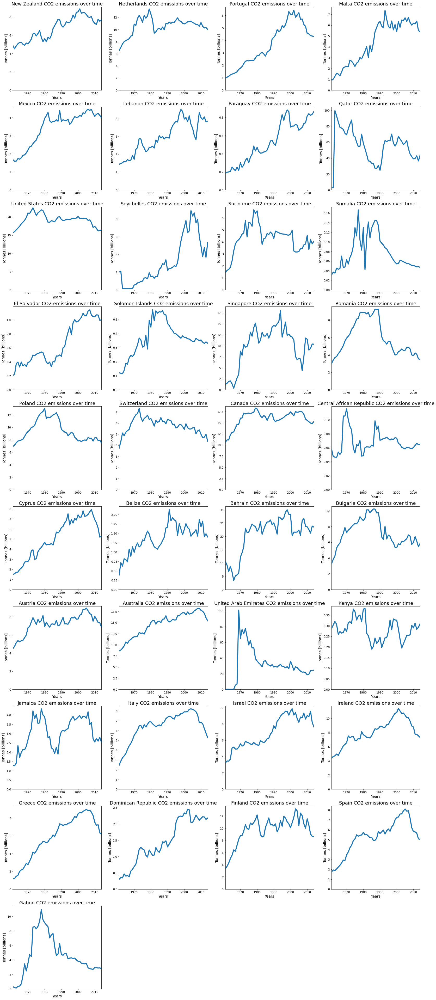

In [112]:
plt.figure(figsize=(28, 450))

show_plots_category(category=increasing_decreasing_co2, dataframe=global_co2_emisions,
                    title_data="CO2 emissions", secondary_value="Value")

<h3><center>Countries from the category decreasing_increasing_co2</center></h3>

In [113]:
decreasing_increasing_co2_value = len(decreasing_increasing_co2) # Holds the number of countries in this category

print(f'{decreasing_increasing_co2_value} out 134 of  are in the category "Countries with overall decrease in CO2 emissions excluding recent years"')
print("\n")

for country in decreasing_increasing_co2:
    print(country)

3 out 134 of  are in the category "Countries with overall decrease in CO2 emissions excluding recent years"


Mozambique
Zambia
Vanuatu


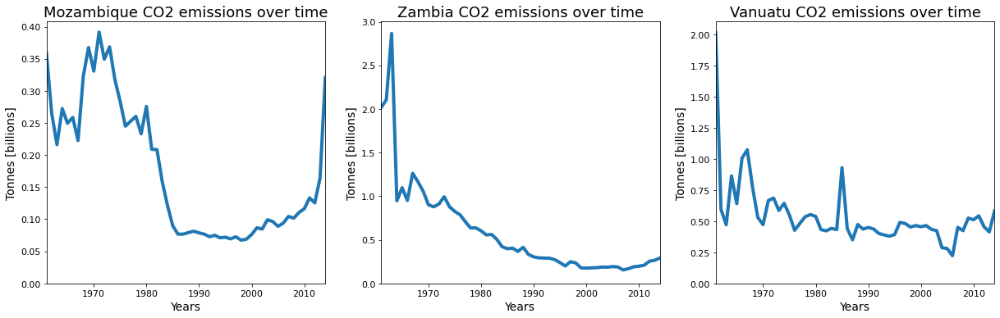

In [114]:
plt.figure(figsize=(28, 450))

show_plots_category(category=decreasing_increasing_co2, dataframe=global_co2_emisions,
                    title_data="CO2 emissions", secondary_value="Value" )

<h3><center>Countries from the category decreasing_decreasing_co2</center></h3>

In [115]:
decreasing_decreasing_co2_value = len(decreasing_decreasing_co2) # Holds the number of countries in this category

print(f'{decreasing_decreasing_co2_value} out 134 of  are in the category "Countries with overall decrease in CO2 emissions including recent years"')
print("\n")

for country in decreasing_decreasing_co2:
    print(country)

10 out 134 of  are in the category "Countries with overall decrease in CO2 emissions including recent years"


Malawi
Kuwait
Zimbabwe
Sweden
Burundi
Denmark
Iceland
Hungary
United Kingdom
France


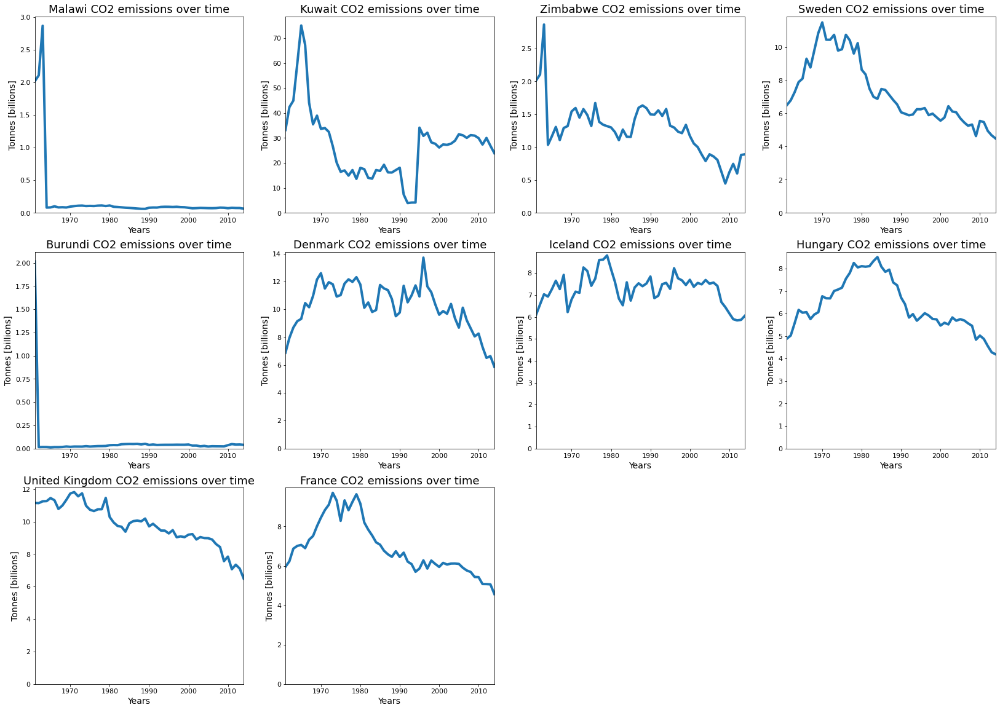

In [116]:
plt.figure(figsize=(28, 450))

show_plots_category(category=decreasing_decreasing_co2, dataframe=global_co2_emisions,
                    title_data="CO2 emissions", secondary_value="Value")

You can take a closer look at each plot if you want. I want to see the distribution of the groups, just as we did for the meat production.






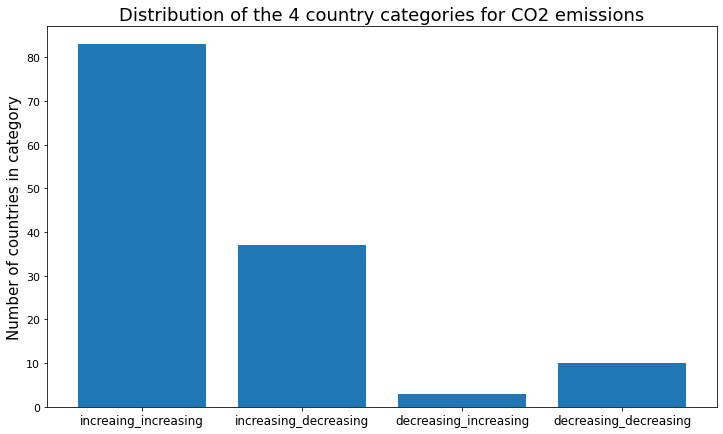

In [117]:
categories = ("increaing_increasing", "increasing_decreasing", "decreasing_increasing", "decreasing_decreasing")
y_pos = np.arange(len(categories))

values = (increasing_increasing_co2_value,
          increasing_decreasing_co2_value,
          decreasing_increasing_co2_value,
          decreasing_decreasing_co2_value)

plt.figure(figsize=(12, 7))

plt.bar(y_pos, values, align='center')
plt.xticks(y_pos, categories, fontsize=12)
plt.ylabel('Number of countries in category', fontsize=15)
plt.title('Distribution of the 4 country categories for CO2 emissions', fontsize=18)

plt.show()

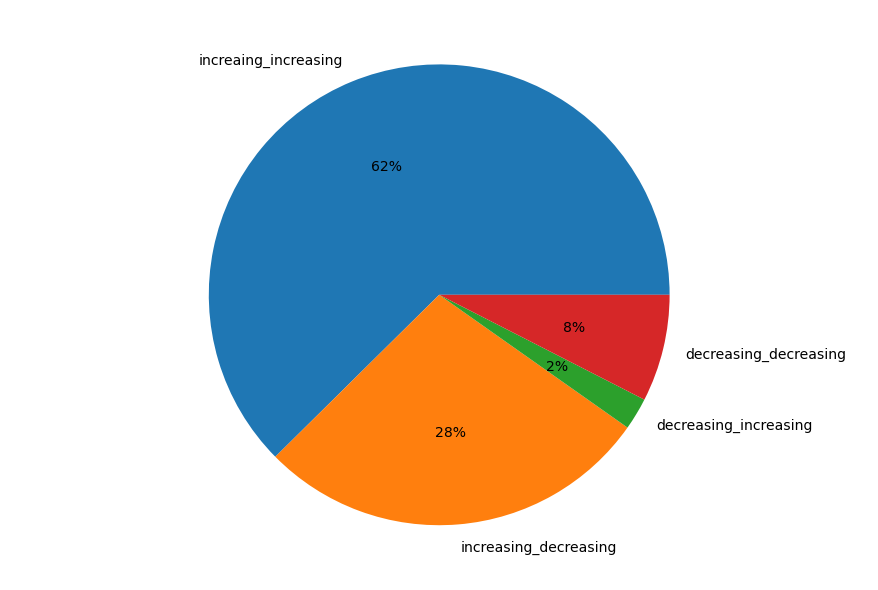

In [118]:
fig = plt.figure()
ax = fig.add_axes([0,1,2,2])
ax.axis('equal')

ax.pie(values, labels = categories,autopct = '%1.0f%%',textprops = {'fontsize': 14})
plt.show()

This data is a bit more pleasant than the meat production one. Here the **increasing_increasing** category takes **62%**, while at the meat production it took **81%** of the whole. Than the portion of **increasing_decreasing** has gone from just **14%** to **28%**. This means more countries have began lowering their CO2 emisions. There are less **decreasing_increasing** and more **decreasing_decreasing** countries. All of this is great news. Both for the enviroment and for this research. If the data was too similar to the other one I could have ended here with the conclusion that there is a very strong corelation. However this is not the case. We see differences, which need further investigation.

Right now we have the data for meat production and for CO2 emissions stored in the same 4 categories. My plan is to use these categories to see if there is any corelation. There are many sources of CO2 polution, but if we find that the same countries or even just small part of them fall into the same category, this would be enough to make a meaningful conclusion. The following code goes through each category, comparing and saving the results, which we will discuss after it.

In [119]:
increasing_increasing_commons, increasing_decreasing_commons, decreasing_increasing_commons, decreasing_decreasing_commons = ([], [], [], []) 

In [120]:
def category_comparison(first_category, second_category, commons):
    """
    Finds common items in two lists
    
    Parameters:
    first_category (list): The first category
    
    second_category (list): The second category
    
    commons (list): Contains the found common values
    """
    
    for item in first_category:
        if item in second_category:
            
            commons.append(item)
        else:
            pass
    
    print(f"Out of {len(first_category)} there are {len(commons)} commons")
    return(commons)

<h3><center>Comparison for the countries from category increasing_increasing</center></h3>

In [121]:
category_comparison(increasing_increasing_meat, increasing_increasing_co2, increasing_increasing_commons)

Out of 145 there are 78 commons


['Albania',
 'Algeria',
 'Angola',
 'Argentina',
 'Bangladesh',
 'Barbados',
 'Benin',
 'Bolivia',
 'Botswana',
 'Brazil',
 'British Virgin Islands',
 'Burkina Faso',
 'Cambodia',
 'Cameroon',
 'Chad',
 'Chile',
 'China',
 'Colombia',
 'Comoros',
 'Costa Rica',
 "Cote d'Ivoire",
 'Cuba',
 'Djibouti',
 'Dominica',
 'Ecuador',
 'Equatorial Guinea',
 'Fiji',
 'Ghana',
 'Grenada',
 'Guatemala',
 'Guinea',
 'Guinea-Bissau',
 'Guyana',
 'Haiti',
 'Honduras',
 'India',
 'Indonesia',
 'Iraq',
 'Japan',
 'Jordan',
 'Kiribati',
 'Liberia',
 'Libya',
 'Madagascar',
 'Malaysia',
 'Mali',
 'Mauritania',
 'Mauritius',
 'Mongolia',
 'Morocco',
 'Myanmar',
 'Nepal',
 'New Caledonia',
 'Nicaragua',
 'Nigeria',
 'Norway',
 'Pakistan',
 'Panama',
 'Papua New Guinea',
 'Peru',
 'Philippines',
 'Rwanda',
 'Samoa',
 'Sao Tome and Principe',
 'Saudi Arabia',
 'Senegal',
 'Sierra Leone',
 'Sri Lanka',
 'Tanzania',
 'Thailand',
 'Togo',
 'Tonga',
 'Trinidad and Tobago',
 'Tunisia',
 'Turkey',
 'Uganda',
 'Urug

<h3><center>Comparison for the countries from category increasing_decreasing</center></h3>

In [122]:
category_comparison(increasing_decreasing_meat, increasing_decreasing_co2, increasing_decreasing_commons)

Out of 26 there are 7 commons


['Cyprus',
 'Greece',
 'Italy',
 'Malta',
 'Netherlands',
 'Seychelles',
 'Singapore']

<h3><center>Comparison for the countries from category decreasing_increasing</center></h3>

In [123]:
category_comparison(decreasing_increasing_meat, decreasing_increasing_co2, decreasing_increasing_commons)

Out of 5 there are 0 commons


[]

<h3><center>Comparison for the countries from category decreasing_decreasing</center></h3>

In [124]:
category_comparison(decreasing_decreasing_meat, decreasing_decreasing_co2, decreasing_decreasing_commons)

Out of 4 there are 0 commons


[]

In total from all categories from **180** countries there are **85**. Note that **91%** of them are in the first category - increasing_increasing. There are just **7** commons out of **26** in the second category. This is **27%** from all of them. There are **no** commons in neither decreasing category. Let's analyse the data with logic in stead of using only raw math and percentages. 

In the first categroy - increasing_increasing, we expect to find big and developing countries with growing iconomics. I expected to find a lot of commons there. To be exact - **54%**. Since we found that meat production is dependent on the human population, we can say that this amount of commons in this category are normal. All of the countries in this category are experiencing growth in the economics and population. This highers the amout of CO2 in the air as well in general. The fact that **54%** of the countries that highered their meat production, also highered their CO2 emissions shows us that there is very strong correlation in this category.

The second category - the real surprise for me. In this category we expect countries that were on the rise, but then their economics and population started to melt down in the recent years. In this category **27%** of the countries lowered their CO2 emissions with the lower meat production. Out of the whole research this is the most interesting find. This really shows a **correlation** between the meat production and the CO2 emissions. The lower the meat production, the lower the CO2 emissions in the air we breath.

I will combine the 2 decreasing categories into 1 paragraph. To start with, there are very few countries that fell into those two categories. This istelf shows that most of the countries are increasing their meat_production and CO2 emissions (as we found out from the first category and the 2 histograms before). It was possible to cherry pick the data in a way that would have provided us with more countries in those categories, but I am not a fan of that. I prefer less, but real results than making an amazing discovery that is completely false if you look closer at the data. The two things we can conclude from the small size and missing commons of those categories: 
 
   1. Not all countries that have lowered their meat production in the last 20 years have seen any results of it, yet. They might become more discovery in the future.
     
     
   2. Very few countries actually have lowered their meat production and population (and CO2 with that).

## Conclusion

The main goal/hypotesis of this whole research was to find if there is a corelation between the meat production and polution in an area. After some research I decided that by polution I will use the CO2 emissions. Well, I did it in the end. **I found out that 54% of the countries that have increased their meat production, have also increased their CO2 emissions. 27% of the countries that have lowered their meat production, have decreased their CO2 emission**. This clearly shows us that there is a strong correlation between the two factors. Global warming is a real thing and somehow in the year 2020 where we can send robots to Mars and have a connection with every single person on the planet at every single moment, there are still people that don't believe in Global warming and Climate change. We are the most advanced species known to us and yet some of us show less cognitive potential than other mamals. If you want to learn about those things I really recommend a [YouTube video](https://www.youtube.com/watch?v=-k-V3ESHcfA) by the amazing scientist and ex NASA engineer [Mark Rober](https://www.youtube.com/channel/UCY1kMZp36IQSyNx_9h4mpCg), featuring [Bill Gates](https://en.wikipedia.org/wiki/Bill_Gates). It can easily be considered the predecessor to this project. 

It's been over a year and a half since I stopped eating meat. I did this because of reasong, explained in the begining, but now I feel even better, because I know that I am doing something good. Not as good as explained at the "articles" I read that stated that by stopping the consumption of meat I will save the planet. One person's difference is almost nothing, but it is true that if the scarcity for meat goes down, it's production will do the same. This was proven to us by the second category of countries. Theis population went down and so did meat production. 

Final disclamer: eating any type of food is entirely up to you. The goal of this project was not to stop you from eating meat, but to educate you about the more dark side of it. Production of anything pollutes the air and water we use. I decided to use meat as an example only because the topic was interesting to me for explained reasons. I am sure that if I do the same research for the same time period for any product that is still in use, I will get similar results.

## Refferances
[The fall of the VHS](https://mydigitalkeepsake.com/2018-6-18-the-rise-and-fall-of-vhs/)

[Food and Agraculture Organization of the United Nations (FAO)](http://www.fao.org/home/en)

[Population Dataset by The World Bank](https://data.worldbank.org/indicator/SP.POP.TOTL)

[Wikipedia](https://en.wikipedia.org/wiki/Main_Page)

[Faroe Islands Wikipedia page](https://en.wikipedia.org/wiki/Faroe_Islands)

[Diagrammm](https://diagrammm.com/histogram)

[What is the true cost of eating meat? ](https://www.theguardian.com/news/2018/may/07/true-cost-of-eating-meat-environment-health-animal-welfare)

[The Guardian](https://www.theguardian.com/international)

[The green, blue and grey water footprints of farm animals and animal products](https://waterfootprint.org/media/downloads/Report-48-WaterFootprint-AnimalProducts-Vol1_1.pdf)

[Carbon dioxide (CO2) Wikipedia page](https://en.wikipedia.org/wiki/Carbon_dioxide)

[Greenhouse gases Wikipedia page](https://en.wikipedia.org/wiki/Greenhouse_gas)

[Greenhouse effect Wikipedia page](https://en.wikipedia.org/wiki/Greenhouse_effect) 

[Global warming Wikipedia page](https://en.wikipedia.org/wiki/Global_warming)

[Overview: Weather, Global Warming and Climate Change (NASA)](https://climate.nasa.gov/resources/global-warming-vs-climate-change/)

[CO2 emissions (metric tons per capita) by The World Bank](https://data.worldbank.org/indicator/EN.ATM.CO2E.PC)

[Feeding Bill Gates a Fake Burger (to save the world) - YouTube video by Mark Rober](https://www.youtube.com/watch?v=-k-V3ESHcfA)

[Bill Gates Wikipedia Page](https://en.wikipedia.org/wiki/Bill_Gates)